In [7]:
# dataset reading

import pandas as pd

dataset = pd.read_csv('Walmart_sales.csv')

dataset.info()

dataset.describe()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6435 entries, 0 to 6434
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Store         6435 non-null   int64  
 1   Date          6435 non-null   object 
 2   Weekly_Sales  6435 non-null   float64
 3   Holiday_Flag  6435 non-null   int64  
 4   Temperature   6435 non-null   float64
 5   Fuel_Price    6435 non-null   float64
 6   CPI           6435 non-null   float64
 7   Unemployment  6435 non-null   float64
dtypes: float64(5), int64(2), object(1)
memory usage: 402.3+ KB


,Store,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
count,6435.000000,6.435000e+03,6435.000000,6435.000000,6435.000000,6435.000000,6435.000000
mean,23.000000,1.046965e+06,0.069930,60.663782,3.358607,171.578394,7.999151
std,12.988182,5.643666e+05,0.255049,18.444933,0.459020,39.356712,1.875885
min,1.000000,2.099862e+05,0.000000,-2.060000,2.472000,126.064000,3.879000
25%,12.000000,5.533501e+05,0.000000,47.460000,2.933000,131.735000,6.891000
50%,23.000000,9.607460e+05,0.000000,62.670000,3.445000,182.616521,7.874000
75%,34.000000,1.420159e+06,0.000000,74.940000,3.735000,212.743293,8.622000
max,45.000000,3.818686e+06,1.000000,100.140000,4.468000,227.232807,14.313000


In [10]:
# fixing data types

dataset['Date'] = pd.to_datetime(dataset['Date'], format='%d-%m-%Y')
dataset['Store'] = dataset['Store'].astype('category')

dataset.info()

dataset

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6435 entries, 0 to 6434
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Store         6435 non-null   category      
 1   Date          6435 non-null   datetime64[ns]
 2   Weekly_Sales  6435 non-null   float64       
 3   Holiday_Flag  6435 non-null   int64         
 4   Temperature   6435 non-null   float64       
 5   Fuel_Price    6435 non-null   float64       
 6   CPI           6435 non-null   float64       
 7   Unemployment  6435 non-null   float64       
dtypes: category(1), datetime64[ns](1), float64(5), int64(1)
memory usage: 359.7 KB


,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
0,1,2010-02-05,1643690.90,0,42.31,2.572,211.096358,8.106
1,1,2010-02-12,1641957.44,1,38.51,2.548,211.242170,8.106
2,1,2010-02-19,1611968.17,0,39.93,2.514,211.289143,8.106
3,1,2010-02-26,1409727.59,0,46.63,2.561,211.319643,8.106
4,1,2010-03-05,1554806.68,0,46.50,2.625,211.350143,8.106
...,...,...,...,...,...,...,...,...
6430,45,2012-09-28,713173.95,0,64.88,3.997,192.013558,8.684
6431,45,2012-10-05,733455.07,0,64.89,3.985,192.170412,8.667
6432,45,2012-10-12,734464.36,0,54.47,4.000,192.327265,8.667
6433,45,2012-10-19,718125.53,0,56.47,3.969,192.330854,8.667


### Modelos de previsão por séries temporais

#### ARIMA

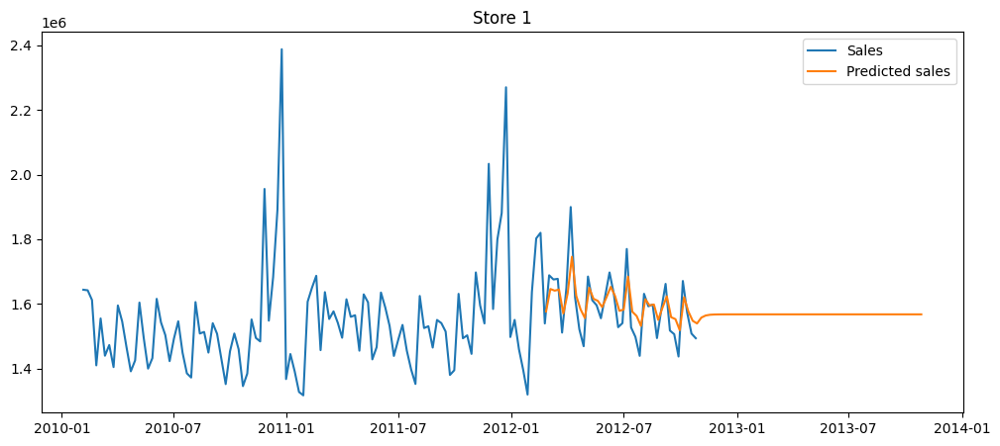

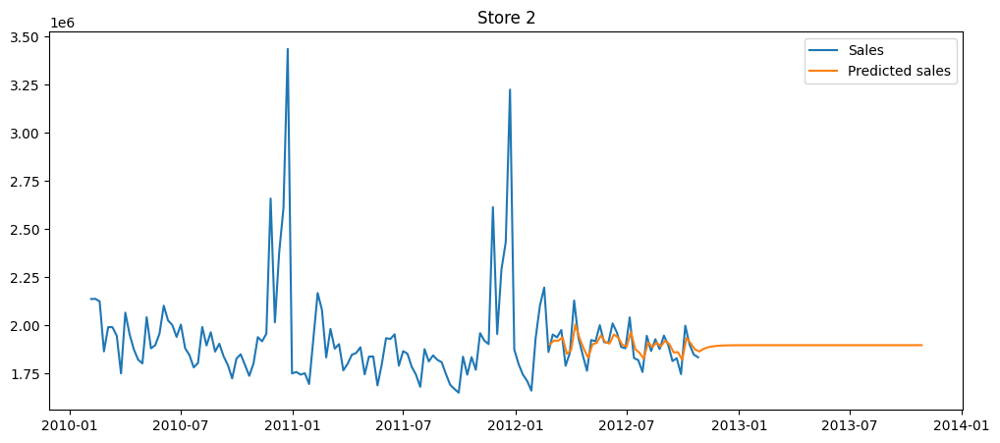

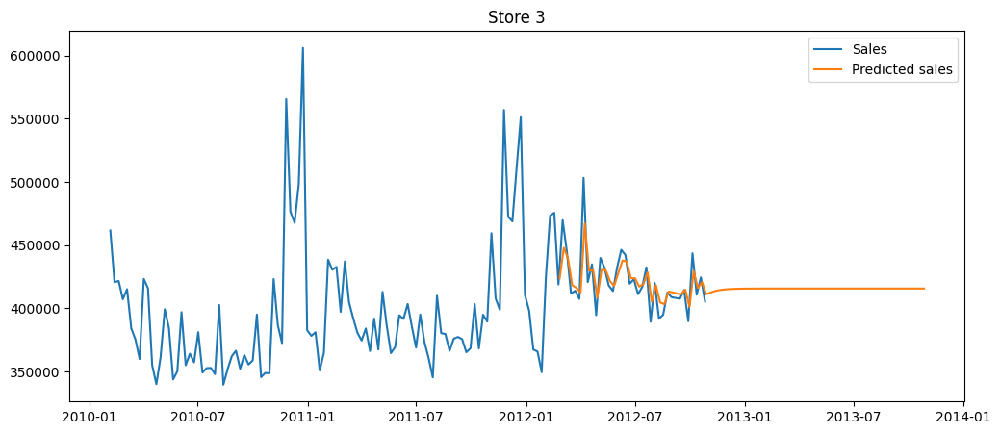

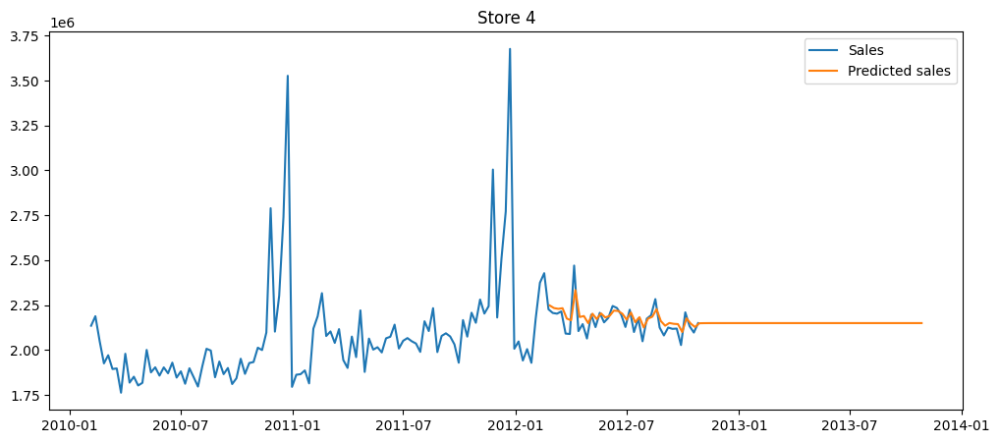

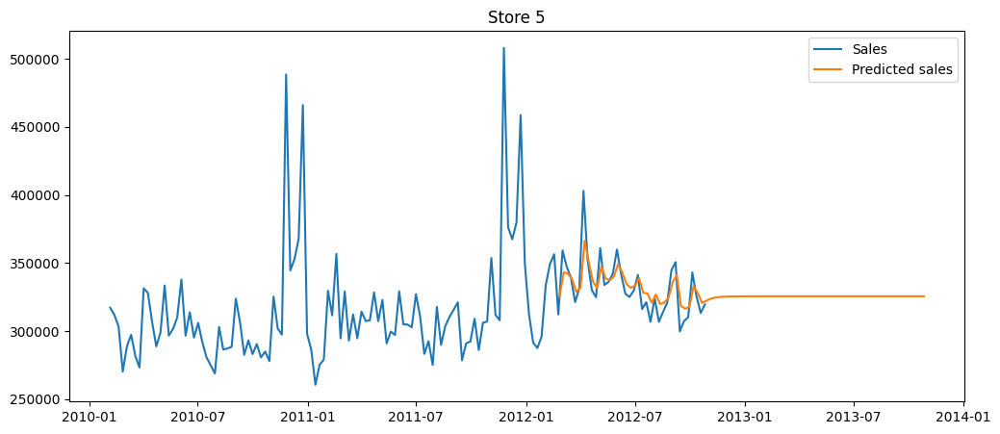

...

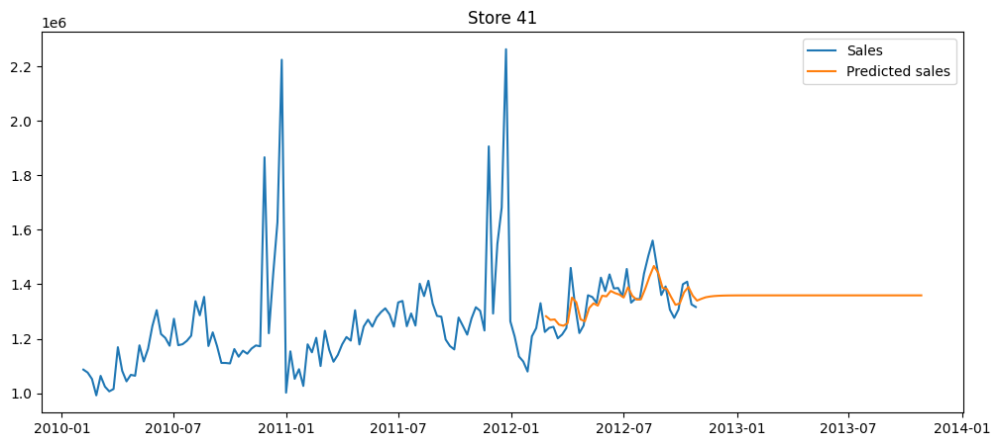

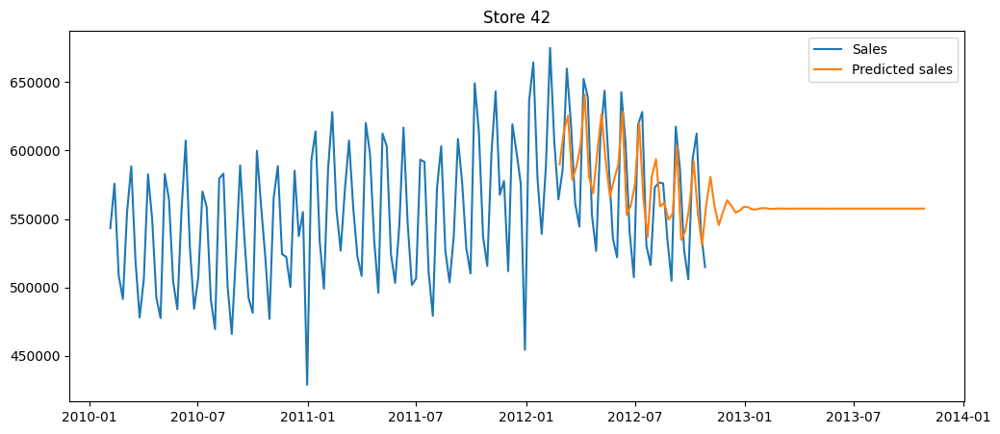

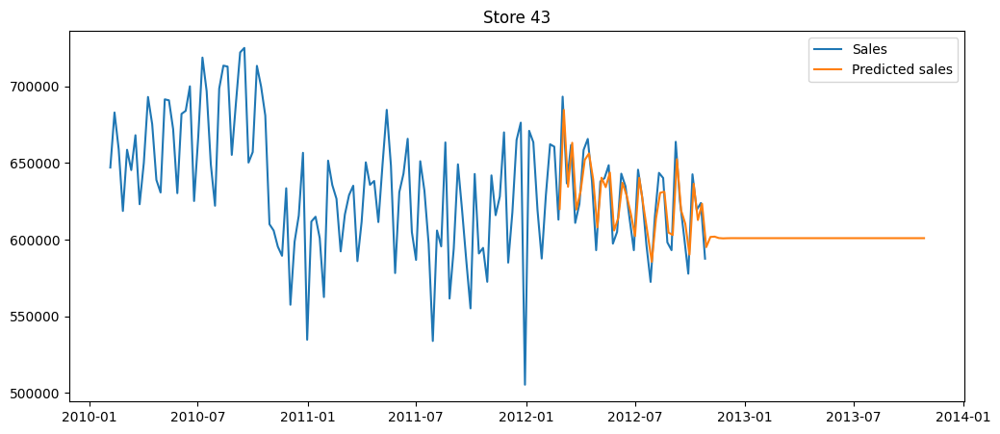

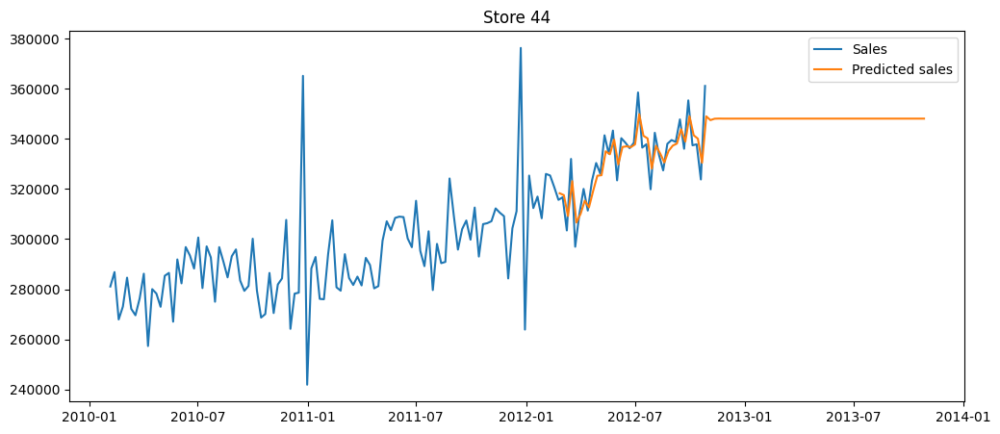

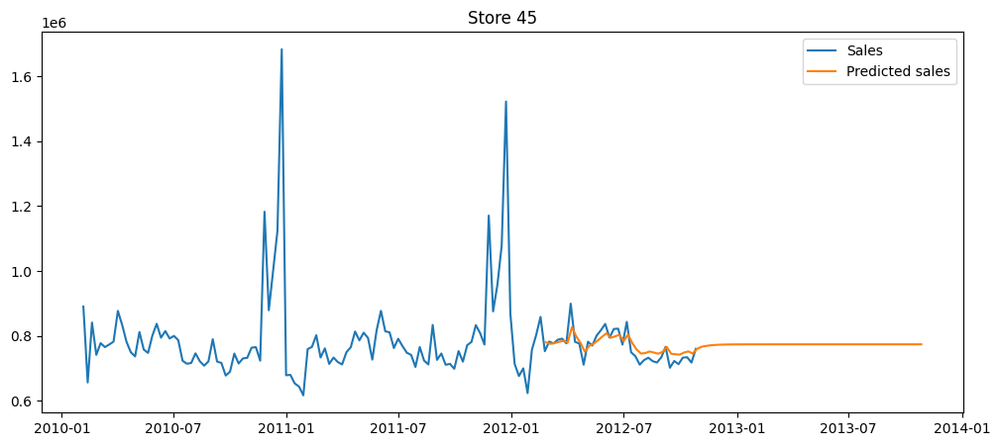

In [104]:
# ARIMA model tests

from statsmodels.tsa.arima.model import ARIMA
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

for store in dataset['Store'].unique():

    tmp = dataset[dataset['Store'] == store]

    train_size = int(len(tmp) * 0.75)

    model = ARIMA(tmp['Weekly_Sales'], order=(2,1,1))
    model_fit = model.fit()

    predictions = model_fit.predict(start=train_size+1, end=tmp.shape[0]+52)

    plt.figure(figsize=(12, 5))
    plt.plot(tmp['Date'], tmp['Weekly_Sales'], label='Sales')
    plt.plot(
        pd.date_range(start=tmp.iloc[train_size]['Date'], periods=len(predictions), freq='W'),
        predictions,
        label='Predicted sales')
    plt.title(f'Store {store}')
    plt.legend()
    plt.show()

#### RNN

Epoch 1/100
2/2 [==============================] - 2s 12ms/step - loss: 0.0618
Epoch 2/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0489
Epoch 3/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0391
Epoch 4/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0309
Epoch 5/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0270
Epoch 6/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0267
Epoch 7/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0280
Epoch 8/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0291
Epoch 9/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0286
Epoch 10/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0273
Epoch 11/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0262
Epoch 12/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0258
Epoch 13/100
2/2 [==============================] - 0s 8ms

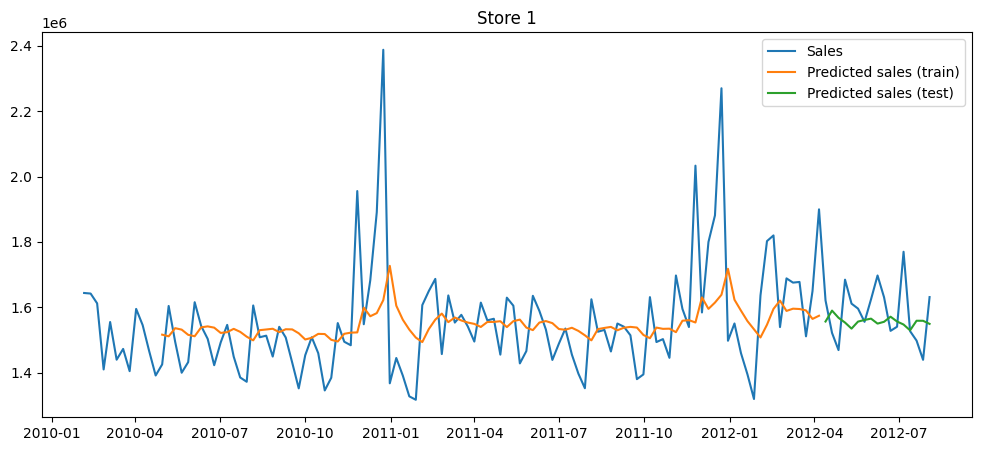

Epoch 1/100
2/2 [==============================] - 2s 9ms/step - loss: 0.0397
Epoch 2/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0334
Epoch 3/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0283
Epoch 4/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0249
Epoch 5/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0237
Epoch 6/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0243
Epoch 7/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0251
Epoch 8/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0249
Epoch 9/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0242
Epoch 10/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0234
Epoch 11/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0233
Epoch 12/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0231
Epoch 13/100
2/2 [==============================] - 

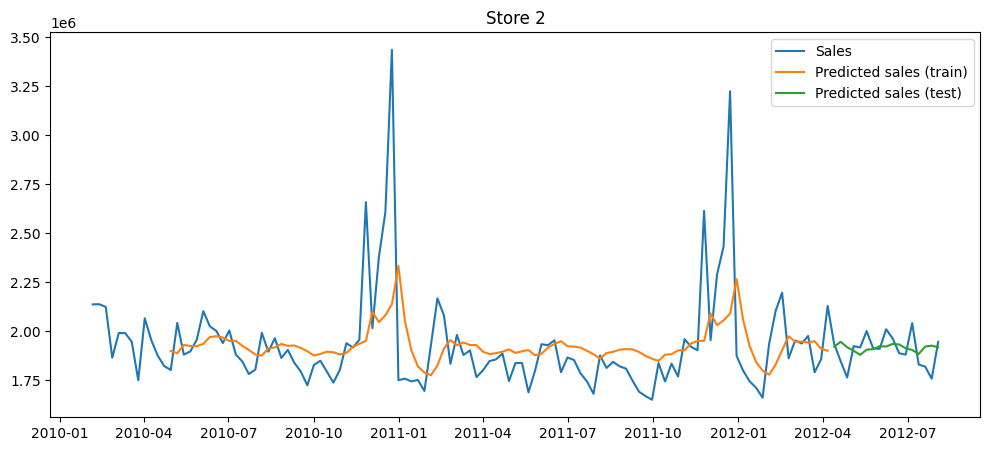

Epoch 1/100
2/2 [==============================] - 1s 8ms/step - loss: 0.1018
Epoch 2/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0829
Epoch 3/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0677
Epoch 4/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0546
Epoch 5/100
2/2 [==============================] - 0s 13ms/step - loss: 0.0443
Epoch 6/100
2/2 [==============================] - 0s 14ms/step - loss: 0.0380
Epoch 7/100
2/2 [==============================] - 0s 12ms/step - loss: 0.0353
Epoch 8/100
2/2 [==============================] - 0s 13ms/step - loss: 0.0364
Epoch 9/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0383
Epoch 10/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0393
Epoch 11/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0382
Epoch 12/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0364
Epoch 13/100
2/2 [==============================] - 0s 9

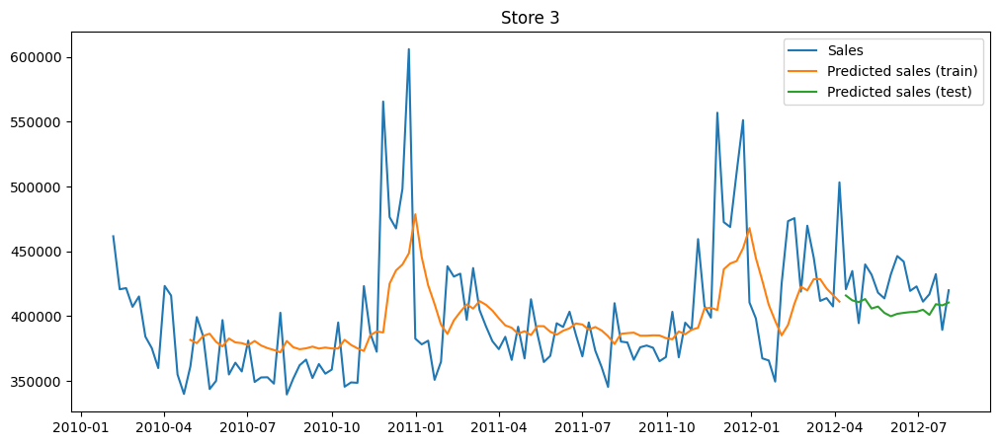

Epoch 1/100
2/2 [==============================] - 2s 8ms/step - loss: 0.0638
Epoch 2/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0528
Epoch 3/100
2/2 [==============================] - 0s 14ms/step - loss: 0.0425
Epoch 4/100
2/2 [==============================] - 0s 13ms/step - loss: 0.0355
Epoch 5/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0300
Epoch 6/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0262
Epoch 7/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0243
Epoch 8/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0243
Epoch 9/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0255
Epoch 10/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0261
Epoch 11/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0259
Epoch 12/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0251
Epoch 13/100
2/2 [==============================] - 0s 9m

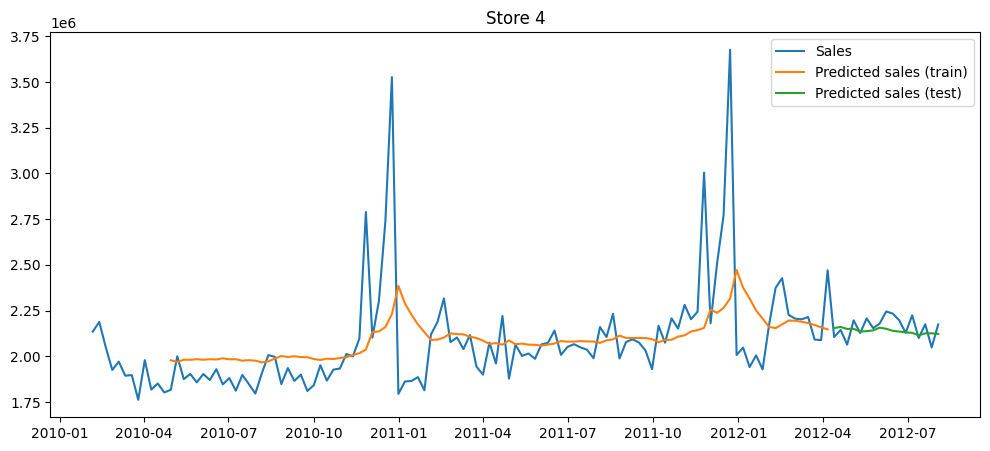

Epoch 1/100
2/2 [==============================] - 2s 17ms/step - loss: 0.0933
Epoch 2/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0759
Epoch 3/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0607
Epoch 4/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0481
Epoch 5/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0391
Epoch 6/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0324
Epoch 7/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0299
Epoch 8/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0295
Epoch 9/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0317
Epoch 10/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0327
Epoch 11/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0320
Epoch 12/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0308
Epoch 13/100
2/2 [==============================] - 0s 9ms

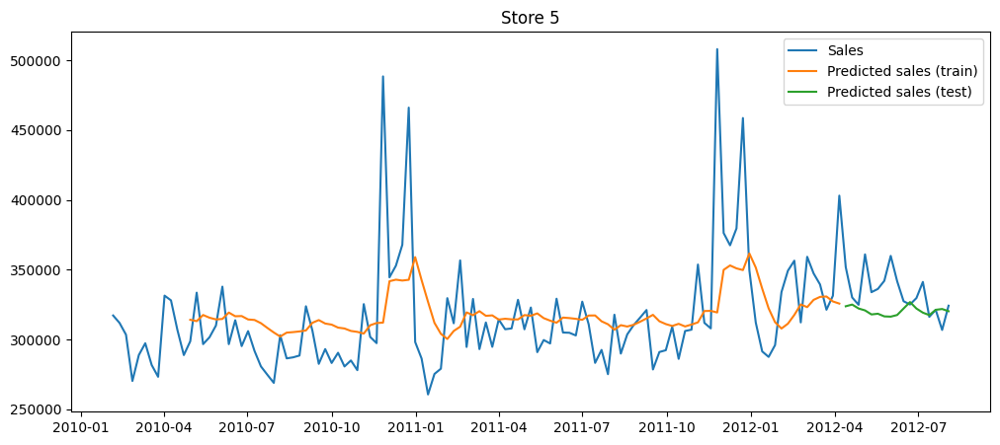

Epoch 1/100
2/2 [==============================] - 2s 7ms/step - loss: 0.0703
Epoch 2/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0569
Epoch 3/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0460
Epoch 4/100
2/2 [==============================] - 0s 12ms/step - loss: 0.0380
Epoch 5/100
2/2 [==============================] - 0s 13ms/step - loss: 0.0319
Epoch 6/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0287
Epoch 7/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0283
Epoch 8/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0298
Epoch 9/100
2/2 [==============================] - 0s 7ms/step - loss: 0.0309
Epoch 10/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0306
Epoch 11/100
2/2 [==============================] - 0s 13ms/step - loss: 0.0297
Epoch 12/100
2/2 [==============================] - 0s 15ms/step - loss: 0.0285
Epoch 13/100
2/2 [==============================] - 0s 1

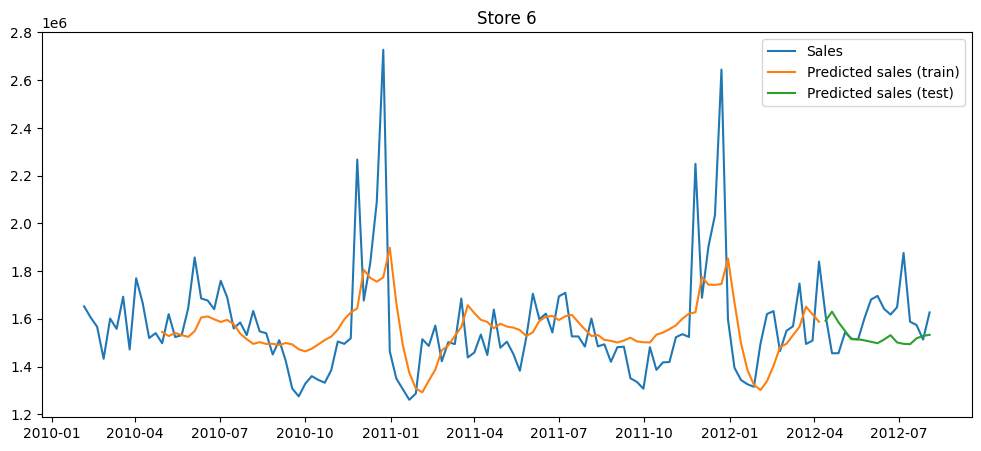

Epoch 1/100
2/2 [==============================] - 2s 8ms/step - loss: 0.1491
Epoch 2/100
2/2 [==============================] - 0s 8ms/step - loss: 0.1215
Epoch 3/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0972
Epoch 4/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0780
Epoch 5/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0615
Epoch 6/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0477
Epoch 7/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0383
Epoch 8/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0321
Epoch 9/100
2/2 [==============================] - 0s 12ms/step - loss: 0.0304
Epoch 10/100
2/2 [==============================] - 0s 14ms/step - loss: 0.0321
Epoch 11/100
2/2 [==============================] - 0s 12ms/step - loss: 0.0341
Epoch 12/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0345
Epoch 13/100
2/2 [==============================] - 0s 9ms

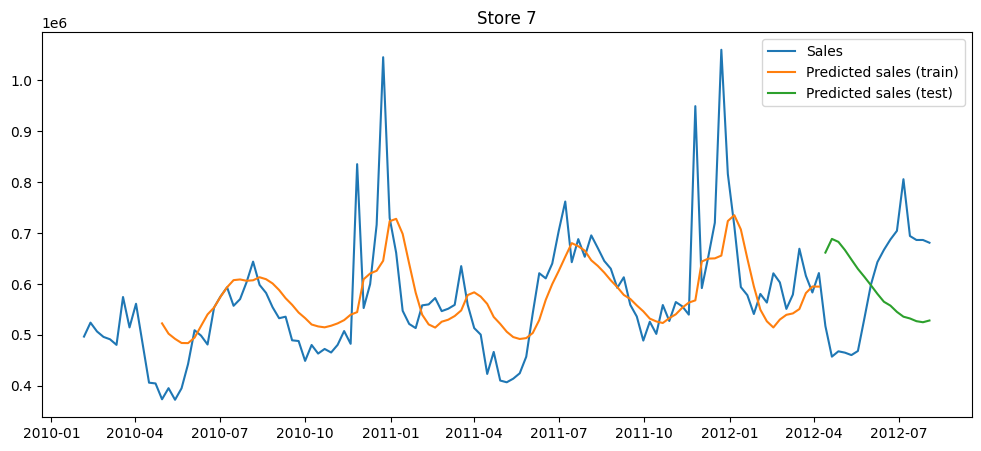

Epoch 1/100
2/2 [==============================] - 2s 8ms/step - loss: 0.0680
Epoch 2/100
2/2 [==============================] - 0s 7ms/step - loss: 0.0559
Epoch 3/100
2/2 [==============================] - 0s 7ms/step - loss: 0.0459
Epoch 4/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0382
Epoch 5/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0320
Epoch 6/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0284
Epoch 7/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0270
Epoch 8/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0266
Epoch 9/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0277
Epoch 10/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0285
Epoch 11/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0285
Epoch 12/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0280
Epoch 13/100
2/2 [==============================] - 0s 8ms/st

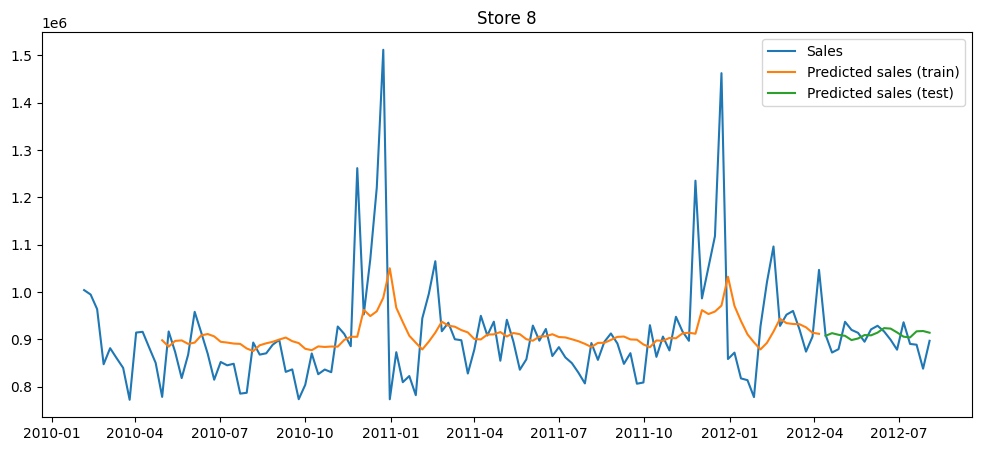

Epoch 1/100
2/2 [==============================] - 2s 8ms/step - loss: 0.0772
Epoch 2/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0615
Epoch 3/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0496
Epoch 4/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0395
Epoch 5/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0335
Epoch 6/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0296
Epoch 7/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0298
Epoch 8/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0313
Epoch 9/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0322
Epoch 10/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0316
Epoch 11/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0305
Epoch 12/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0295
Epoch 13/100
2/2 [==============================] - 0s 8ms/s

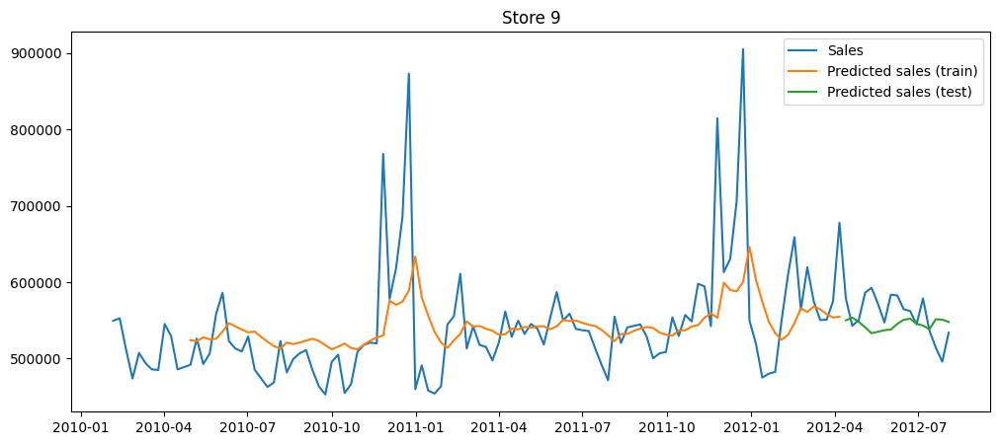

Epoch 1/100
2/2 [==============================] - 2s 9ms/step - loss: 0.0383
Epoch 2/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0320
Epoch 3/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0277
Epoch 4/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0254
Epoch 5/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0255
Epoch 6/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0267
Epoch 7/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0269
Epoch 8/100
2/2 [==============================] - 0s 7ms/step - loss: 0.0263
Epoch 9/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0254
Epoch 10/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0248
Epoch 11/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0245
Epoch 12/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0245
Epoch 13/100
2/2 [==============================] - 0s 9ms/s

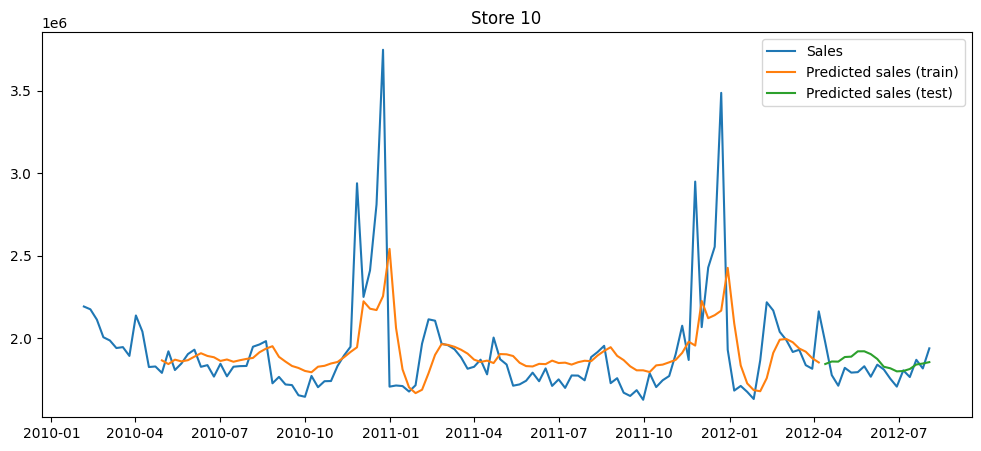

Epoch 1/100
2/2 [==============================] - 2s 7ms/step - loss: 0.0629
Epoch 2/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0500
Epoch 3/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0396
Epoch 4/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0315
Epoch 5/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0269
Epoch 6/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0244
Epoch 7/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0250
Epoch 8/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0266
Epoch 9/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0276
Epoch 10/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0270
Epoch 11/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0258
Epoch 12/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0248
Epoch 13/100
2/2 [==============================] - 0s 8ms/st

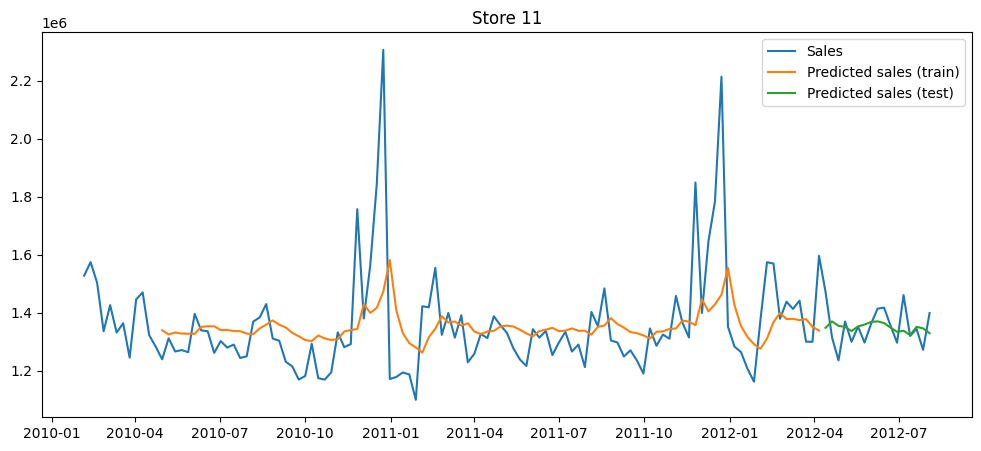

Epoch 1/100
2/2 [==============================] - 2s 10ms/step - loss: 0.0821
Epoch 2/100
2/2 [==============================] - 0s 12ms/step - loss: 0.0654
Epoch 3/100
2/2 [==============================] - 0s 15ms/step - loss: 0.0515
Epoch 4/100
2/2 [==============================] - 0s 12ms/step - loss: 0.0409
Epoch 5/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0335
Epoch 6/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0292
Epoch 7/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0282
Epoch 8/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0294
Epoch 9/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0311
Epoch 10/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0314
Epoch 11/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0305
Epoch 12/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0289
Epoch 13/100
2/2 [==============================] - 0s 9

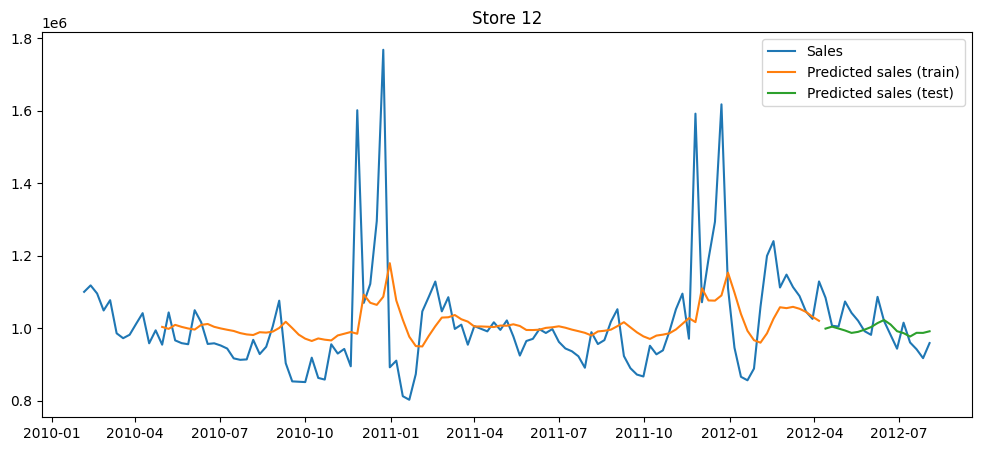

Epoch 1/100
2/2 [==============================] - 2s 8ms/step - loss: 0.0531
Epoch 2/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0426
Epoch 3/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0348
Epoch 4/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0294
Epoch 5/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0254
Epoch 6/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0245
Epoch 7/100
2/2 [==============================] - 0s 7ms/step - loss: 0.0257
Epoch 8/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0266
Epoch 9/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0265
Epoch 10/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0257
Epoch 11/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0250
Epoch 12/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0242
Epoch 13/100
2/2 [==============================] - 0s 8ms/st

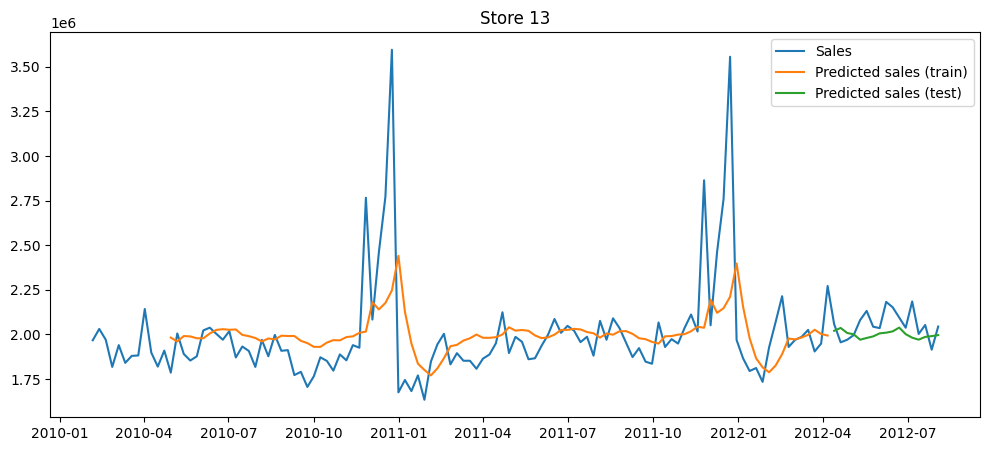

Epoch 1/100
2/2 [==============================] - 2s 8ms/step - loss: 0.1001
Epoch 2/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0787
Epoch 3/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0603
Epoch 4/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0453
Epoch 5/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0335
Epoch 6/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0249
Epoch 7/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0198
Epoch 8/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0201
Epoch 9/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0228
Epoch 10/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0245
Epoch 11/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0236
Epoch 12/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0218
Epoch 13/100
2/2 [==============================] - 0s 8ms/st

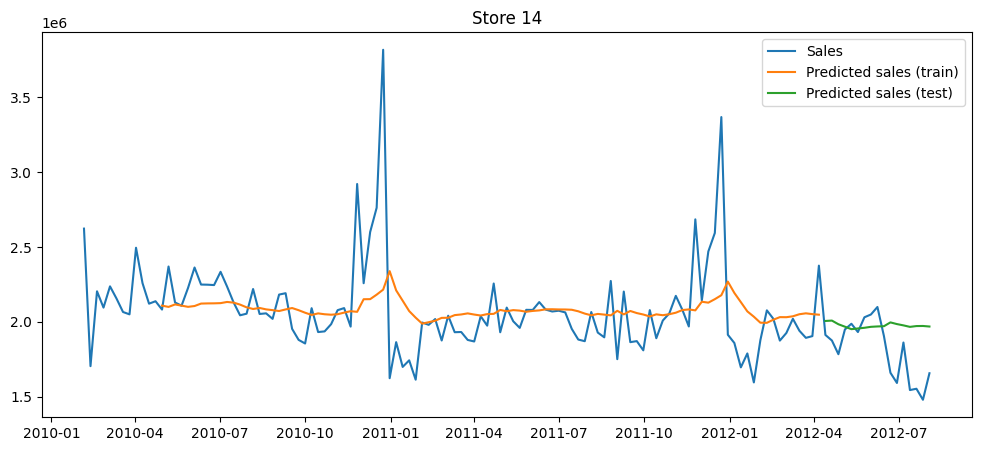

Epoch 1/100
2/2 [==============================] - 2s 9ms/step - loss: 0.0416
Epoch 2/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0323
Epoch 3/100
2/2 [==============================] - 0s 13ms/step - loss: 0.0257
Epoch 4/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0227
Epoch 5/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0234
Epoch 6/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0248
Epoch 7/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0247
Epoch 8/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0237
Epoch 9/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0227
Epoch 10/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0220
Epoch 11/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0219
Epoch 12/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0220
Epoch 13/100
2/2 [==============================] - 0s

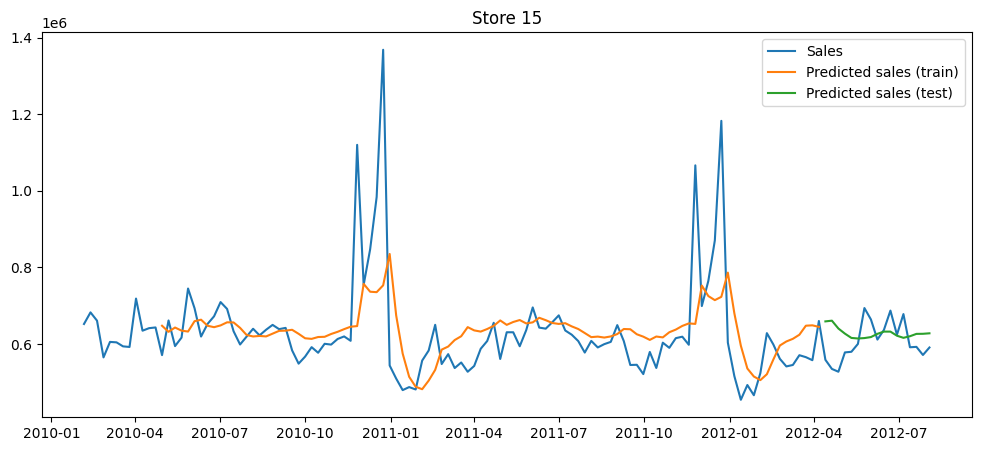

Epoch 1/100
2/2 [==============================] - 1s 10ms/step - loss: 0.0858
Epoch 2/100
2/2 [==============================] - 0s 15ms/step - loss: 0.0672
Epoch 3/100
2/2 [==============================] - 0s 13ms/step - loss: 0.0516
Epoch 4/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0382
Epoch 5/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0282
Epoch 6/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0230
Epoch 7/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0235
Epoch 8/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0254
Epoch 9/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0267
Epoch 10/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0259
Epoch 11/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0242
Epoch 12/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0227
Epoch 13/100
2/2 [==============================] - 0

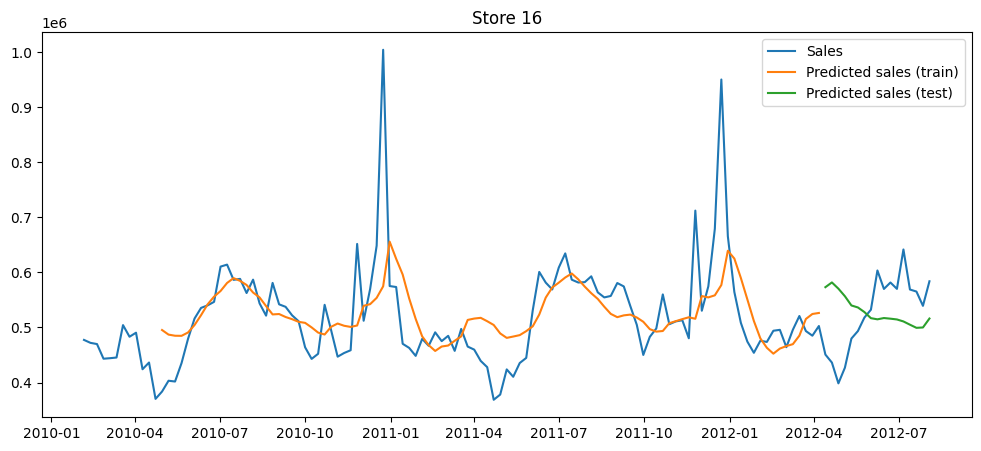

Epoch 1/100
2/2 [==============================] - 2s 8ms/step - loss: 0.1070
Epoch 2/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0752
Epoch 3/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0498
Epoch 4/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0327
Epoch 5/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0290
Epoch 6/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0332
Epoch 7/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0385
Epoch 8/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0378
Epoch 9/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0335
Epoch 10/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0298
Epoch 11/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0283
Epoch 12/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0283
Epoch 13/100
2/2 [==============================] - 0s

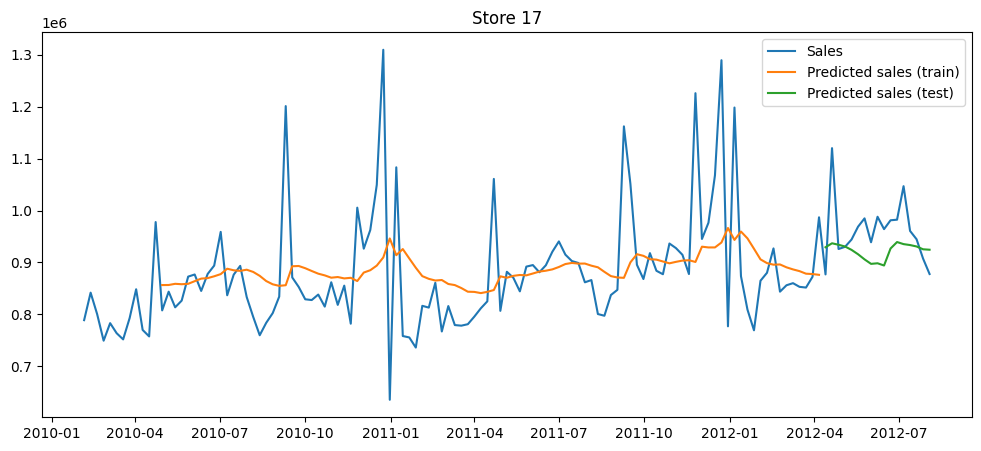

Epoch 1/100
2/2 [==============================] - 2s 11ms/step - loss: 0.2081
Epoch 2/100
2/2 [==============================] - 0s 14ms/step - loss: 0.1632
Epoch 3/100
2/2 [==============================] - 0s 16ms/step - loss: 0.1253
Epoch 4/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0945
Epoch 5/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0688
Epoch 6/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0475
Epoch 7/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0321
Epoch 8/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0237
Epoch 9/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0201
Epoch 10/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0236
Epoch 11/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0282
Epoch 12/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0294
Epoch 13/100
2/2 [==============================] - 

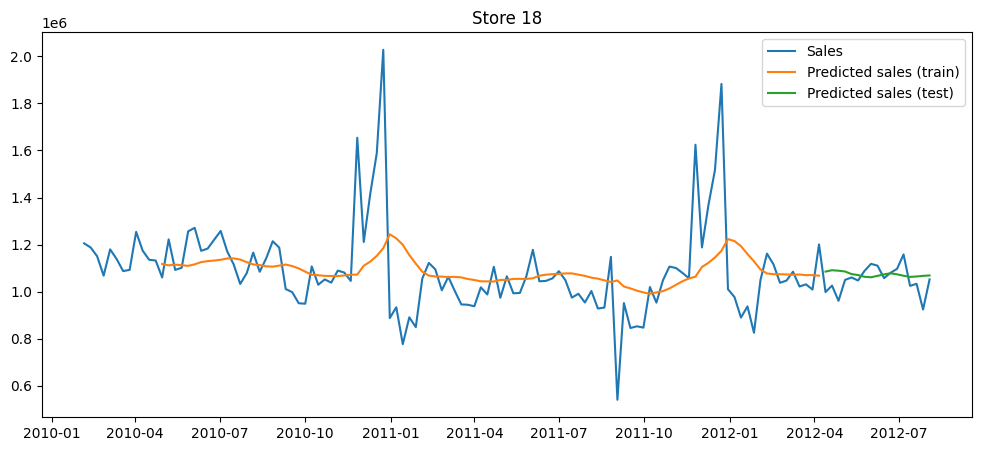

Epoch 1/100
2/2 [==============================] - 1s 8ms/step - loss: 0.0579
Epoch 2/100
2/2 [==============================] - 0s 13ms/step - loss: 0.0457
Epoch 3/100
2/2 [==============================] - 0s 12ms/step - loss: 0.0367
Epoch 4/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0294
Epoch 5/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0240
Epoch 6/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0232
Epoch 7/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0241
Epoch 8/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0251
Epoch 9/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0253
Epoch 10/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0247
Epoch 11/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0234
Epoch 12/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0228
Epoch 13/100
2/2 [==============================] - 0s 9ms

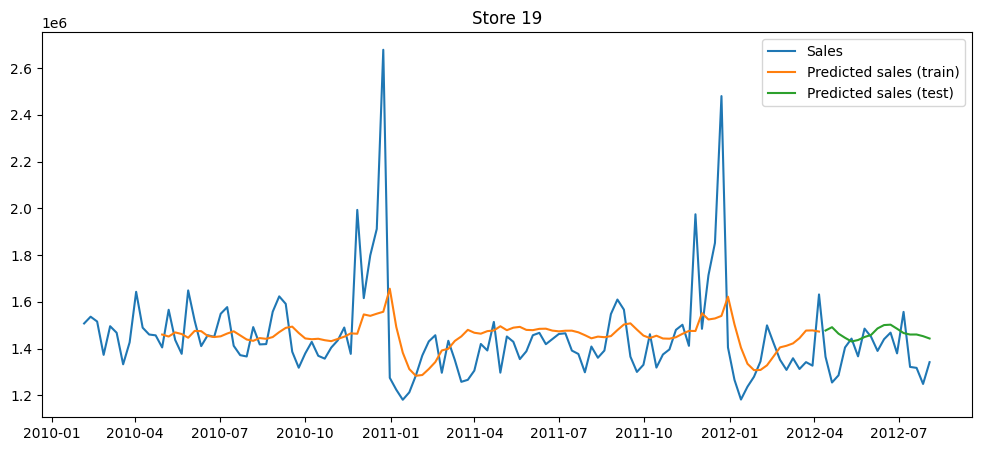

Epoch 1/100
2/2 [==============================] - 2s 8ms/step - loss: 0.0480
Epoch 2/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0375
Epoch 3/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0303
Epoch 4/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0257
Epoch 5/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0237
Epoch 6/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0251
Epoch 7/100
2/2 [==============================] - 0s 7ms/step - loss: 0.0258
Epoch 8/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0254
Epoch 9/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0244
Epoch 10/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0238
Epoch 11/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0231
Epoch 12/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0233
Epoch 13/100
2/2 [==============================] - 0s 8ms/st

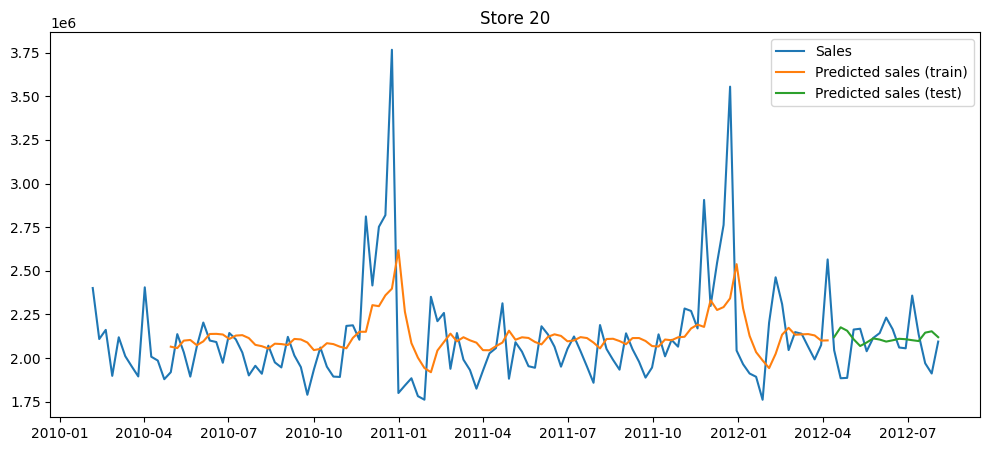

Epoch 1/100
2/2 [==============================] - 2s 8ms/step - loss: 0.0608
Epoch 2/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0486
Epoch 3/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0394
Epoch 4/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0320
Epoch 5/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0270
Epoch 6/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0236
Epoch 7/100
2/2 [==============================] - 0s 7ms/step - loss: 0.0229
Epoch 8/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0246
Epoch 9/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0258
Epoch 10/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0255
Epoch 11/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0246
Epoch 12/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0236
Epoch 13/100
2/2 [==============================] - 0s 11ms/

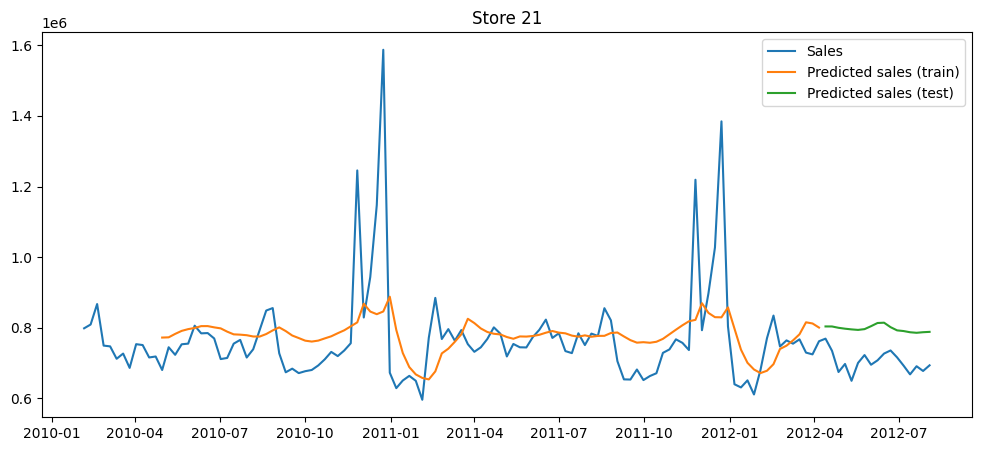

Epoch 1/100
2/2 [==============================] - 2s 9ms/step - loss: 0.0839
Epoch 2/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0677
Epoch 3/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0534
Epoch 4/100
2/2 [==============================] - 0s 12ms/step - loss: 0.0428
Epoch 5/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0350
Epoch 6/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0296
Epoch 7/100
2/2 [==============================] - 0s 7ms/step - loss: 0.0280
Epoch 8/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0279
Epoch 9/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0301
Epoch 10/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0307
Epoch 11/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0301
Epoch 12/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0287
Epoch 13/100
2/2 [==============================] - 0s 8ms

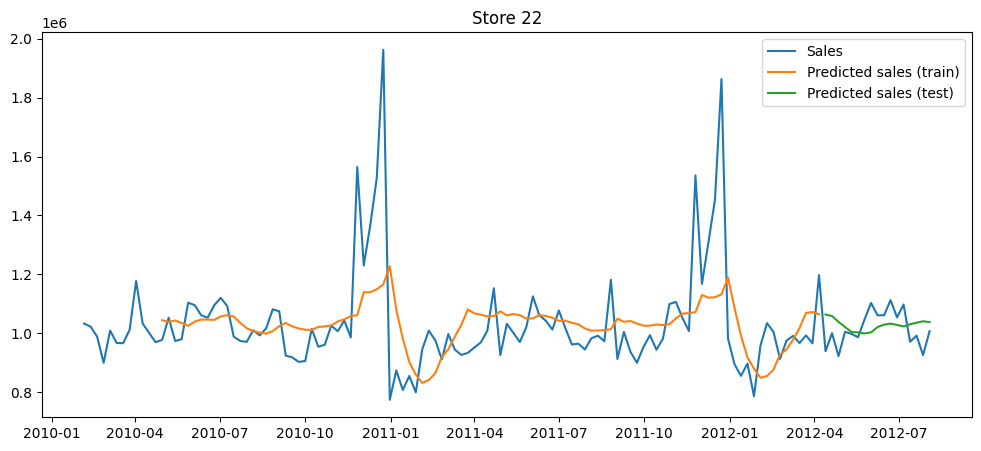

Epoch 1/100
2/2 [==============================] - 3s 9ms/step - loss: 0.0620
Epoch 2/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0502
Epoch 3/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0395
Epoch 4/100
2/2 [==============================] - 0s 12ms/step - loss: 0.0333
Epoch 5/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0294
Epoch 6/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0298
Epoch 7/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0305
Epoch 8/100
2/2 [==============================] - 0s 17ms/step - loss: 0.0312
Epoch 9/100
2/2 [==============================] - 0s 21ms/step - loss: 0.0305
Epoch 10/100
2/2 [==============================] - 0s 17ms/step - loss: 0.0294
Epoch 11/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0282
Epoch 12/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0277
Epoch 13/100
2/2 [==============================] -

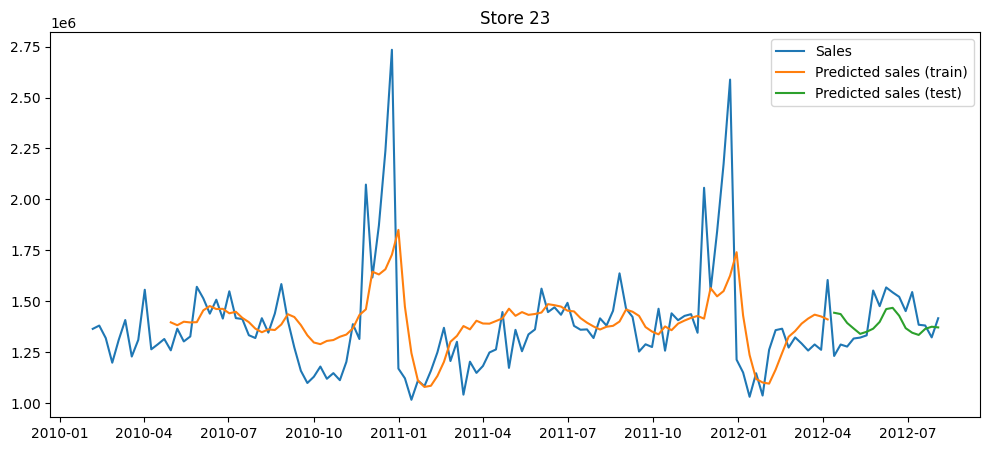

Epoch 1/100
2/2 [==============================] - 2s 11ms/step - loss: 0.0763
Epoch 2/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0589
Epoch 3/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0443
Epoch 4/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0331
Epoch 5/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0264
Epoch 6/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0227
Epoch 7/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0228
Epoch 8/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0252
Epoch 9/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0258
Epoch 10/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0248
Epoch 11/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0234
Epoch 12/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0222
Epoch 13/100
2/2 [==============================] - 0s 

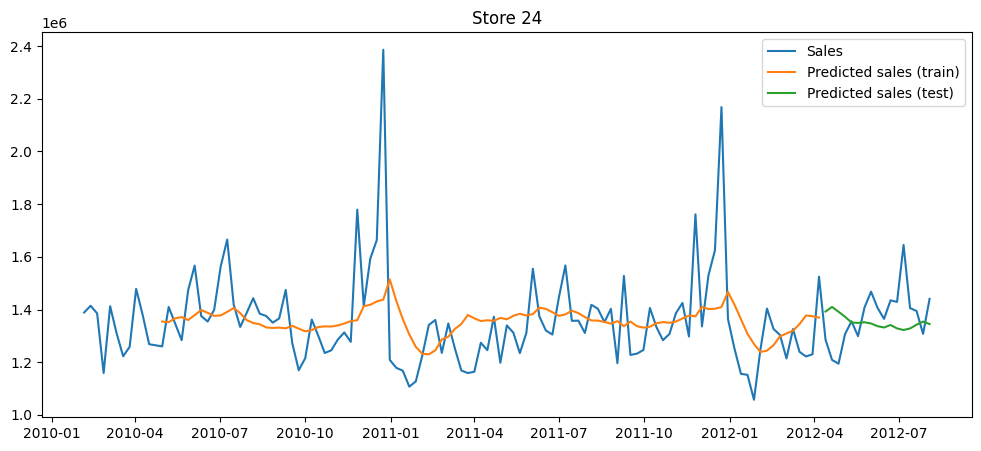

Epoch 1/100
2/2 [==============================] - 2s 11ms/step - loss: 0.0486
Epoch 2/100
2/2 [==============================] - 0s 15ms/step - loss: 0.0390
Epoch 3/100
2/2 [==============================] - 0s 17ms/step - loss: 0.0335
Epoch 4/100
2/2 [==============================] - 0s 15ms/step - loss: 0.0296
Epoch 5/100
2/2 [==============================] - 0s 16ms/step - loss: 0.0294
Epoch 6/100
2/2 [==============================] - 0s 15ms/step - loss: 0.0305
Epoch 7/100
2/2 [==============================] - 0s 13ms/step - loss: 0.0306
Epoch 8/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0297
Epoch 9/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0285
Epoch 10/100
2/2 [==============================] - 0s 26ms/step - loss: 0.0279
Epoch 11/100
2/2 [==============================] - 0s 12ms/step - loss: 0.0276
Epoch 12/100
2/2 [==============================] - 0s 12ms/step - loss: 0.0275
Epoch 13/100
2/2 [==============================]

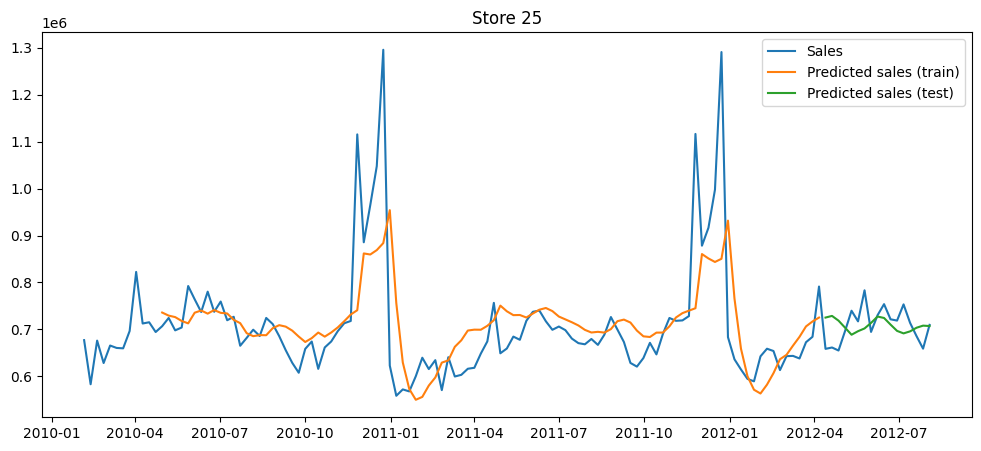

Epoch 1/100
2/2 [==============================] - 2s 10ms/step - loss: 0.1183
Epoch 2/100
2/2 [==============================] - 0s 13ms/step - loss: 0.0948
Epoch 3/100
2/2 [==============================] - 0s 14ms/step - loss: 0.0747
Epoch 4/100
2/2 [==============================] - 0s 12ms/step - loss: 0.0589
Epoch 5/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0458
Epoch 6/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0358
Epoch 7/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0298
Epoch 8/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0276
Epoch 9/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0286
Epoch 10/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0304
Epoch 11/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0313
Epoch 12/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0305
Epoch 13/100
2/2 [==============================] -

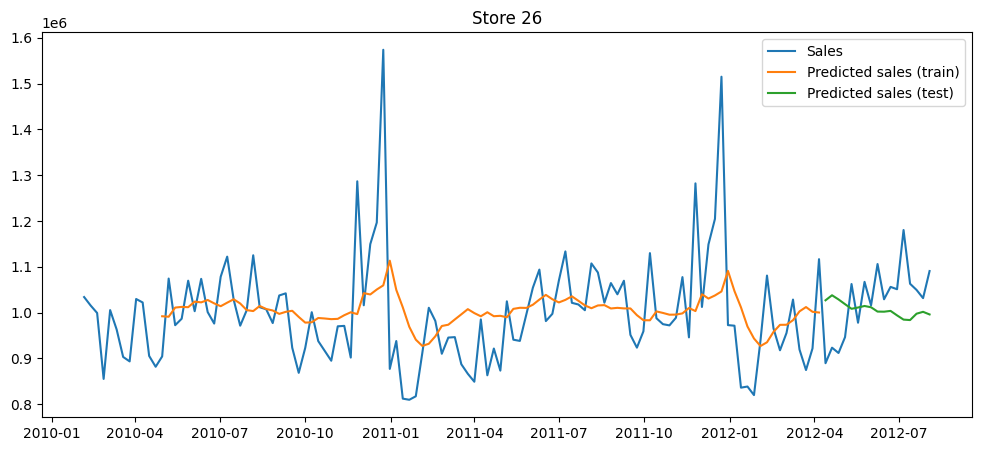

Epoch 1/100
2/2 [==============================] - 2s 9ms/step - loss: 0.0922
Epoch 2/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0697
Epoch 3/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0504
Epoch 4/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0364
Epoch 5/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0262
Epoch 6/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0229
Epoch 7/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0234
Epoch 8/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0269
Epoch 9/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0275
Epoch 10/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0258
Epoch 11/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0236
Epoch 12/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0220
Epoch 13/100
2/2 [==============================] - 

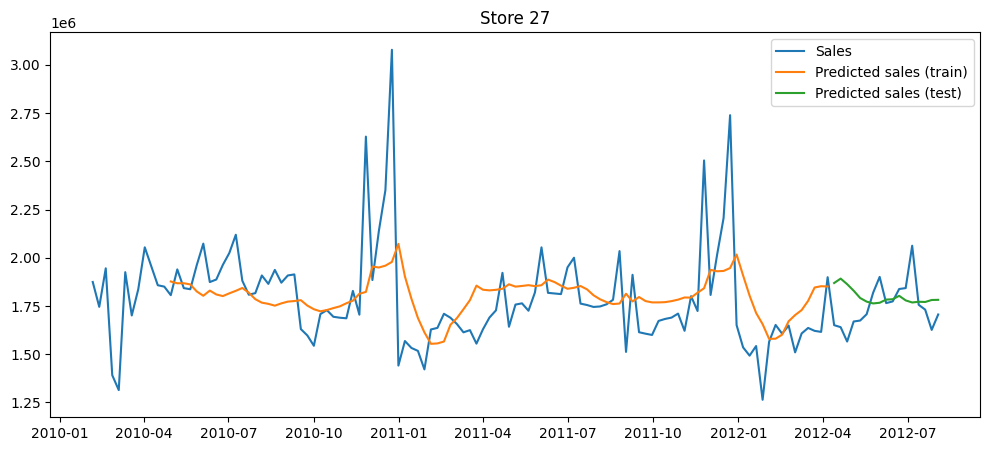

Epoch 1/100
2/2 [==============================] - 1s 14ms/step - loss: 0.1520
Epoch 2/100
2/2 [==============================] - 0s 14ms/step - loss: 0.1255
Epoch 3/100
2/2 [==============================] - 0s 10ms/step - loss: 0.1053
Epoch 4/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0870
Epoch 5/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0733
Epoch 6/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0607
Epoch 7/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0522
Epoch 8/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0450
Epoch 9/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0424
Epoch 10/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0429
Epoch 11/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0453
Epoch 12/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0465
Epoch 13/100
2/2 [==============================] - 0s 10

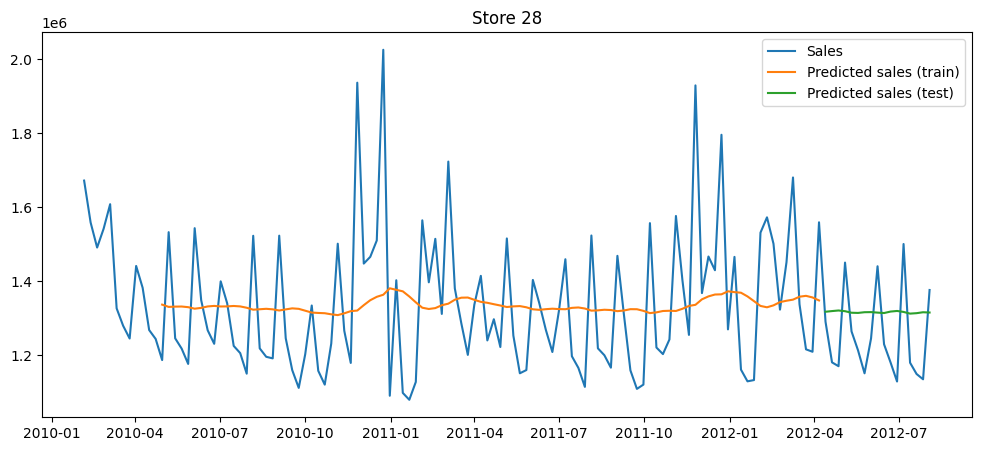

Epoch 1/100
2/2 [==============================] - 2s 8ms/step - loss: 0.0709
Epoch 2/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0580
Epoch 3/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0480
Epoch 4/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0390
Epoch 5/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0324
Epoch 6/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0281
Epoch 7/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0262
Epoch 8/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0274
Epoch 9/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0283
Epoch 10/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0284
Epoch 11/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0275
Epoch 12/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0264
Epoch 13/100
2/2 [==============================] - 0s 8ms/st

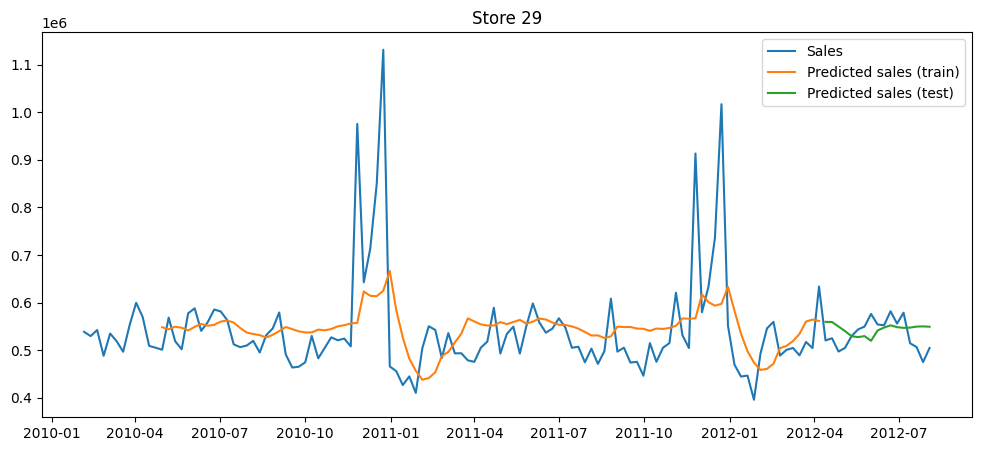

Epoch 1/100
2/2 [==============================] - 2s 9ms/step - loss: 0.2825
Epoch 2/100
2/2 [==============================] - 0s 11ms/step - loss: 0.2245
Epoch 3/100
2/2 [==============================] - 0s 11ms/step - loss: 0.1755
Epoch 4/100
2/2 [==============================] - 0s 12ms/step - loss: 0.1320
Epoch 5/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0949
Epoch 6/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0648
Epoch 7/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0409
Epoch 8/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0246
Epoch 9/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0204
Epoch 10/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0251
Epoch 11/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0315
Epoch 12/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0333
Epoch 13/100
2/2 [==============================] - 0s 9m

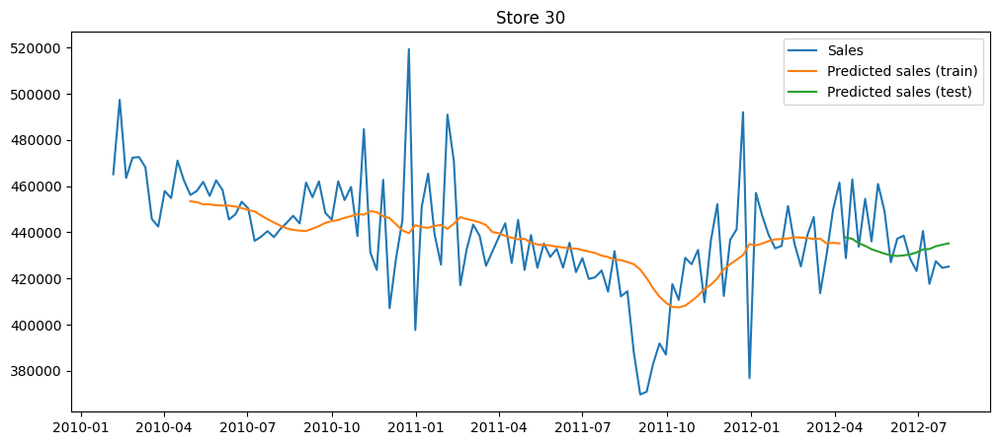

Epoch 1/100
2/2 [==============================] - 2s 8ms/step - loss: 0.0725
Epoch 2/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0543
Epoch 3/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0409
Epoch 4/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0311
Epoch 5/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0273
Epoch 6/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0267
Epoch 7/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0286
Epoch 8/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0300
Epoch 9/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0297
Epoch 10/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0282
Epoch 11/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0271
Epoch 12/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0261
Epoch 13/100
2/2 [==============================] - 0s

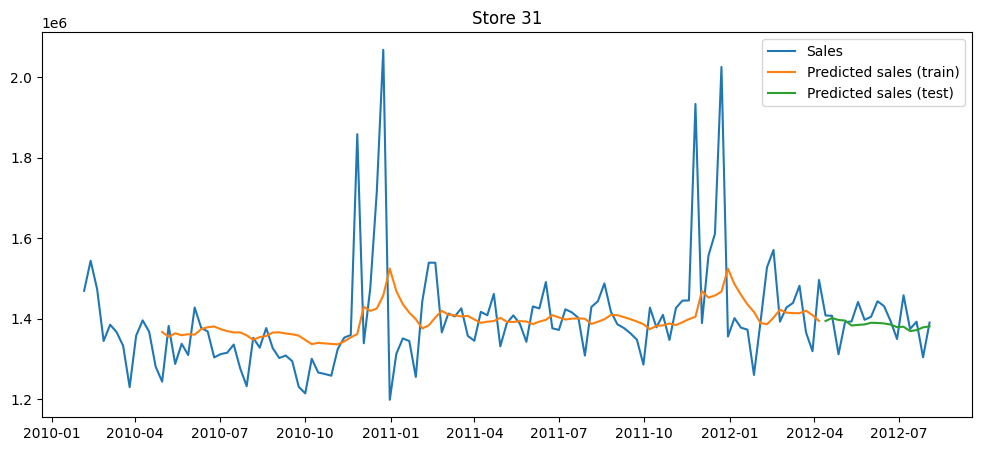

Epoch 1/100
2/2 [==============================] - 2s 9ms/step - loss: 0.0648
Epoch 2/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0508
Epoch 3/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0394
Epoch 4/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0306
Epoch 5/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0259
Epoch 6/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0261
Epoch 7/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0283
Epoch 8/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0289
Epoch 9/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0277
Epoch 10/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0260
Epoch 11/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0250
Epoch 12/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0246
Epoch 13/100
2/2 [==============================] - 0s 9ms/

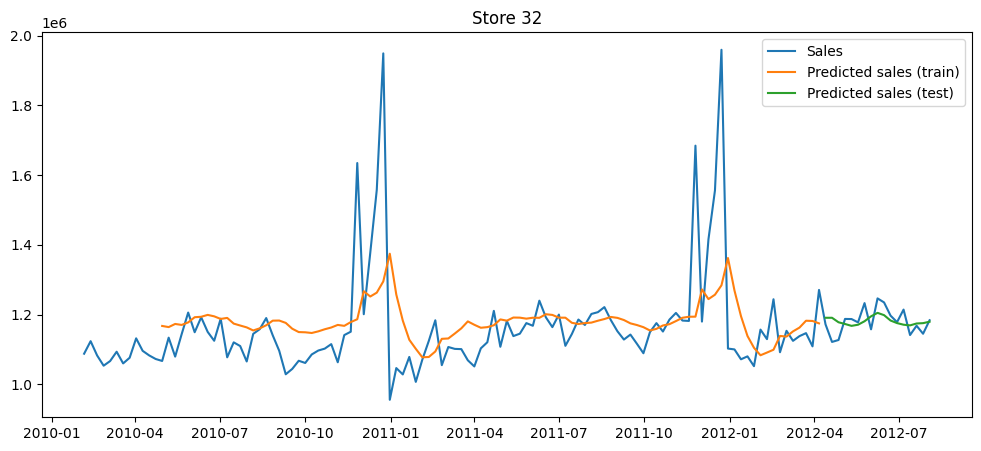

Epoch 1/100
2/2 [==============================] - 2s 9ms/step - loss: 0.1273
Epoch 2/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0944
Epoch 3/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0677
Epoch 4/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0475
Epoch 5/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0322
Epoch 6/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0268
Epoch 7/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0290
Epoch 8/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0345
Epoch 9/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0354
Epoch 10/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0320
Epoch 11/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0286
Epoch 12/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0268
Epoch 13/100
2/2 [==============================] - 0s 9

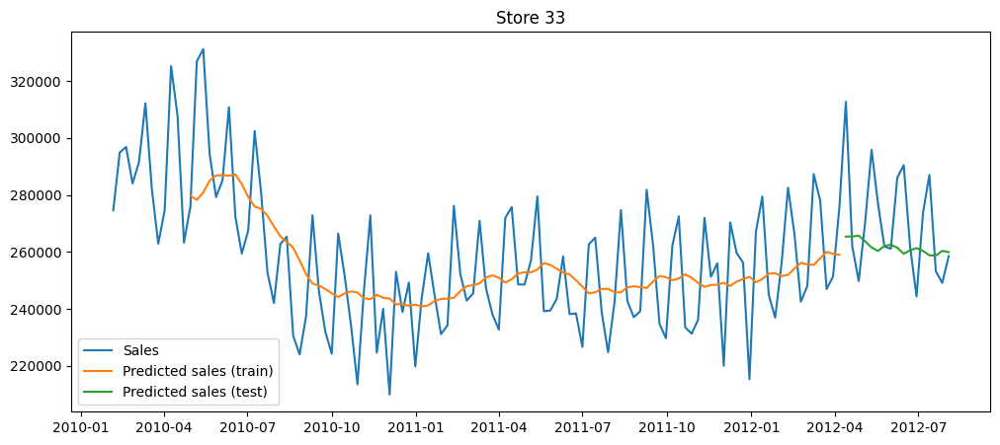

Epoch 1/100
2/2 [==============================] - 2s 9ms/step - loss: 0.0341
Epoch 2/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0274
Epoch 3/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0240
Epoch 4/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0228
Epoch 5/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0237
Epoch 6/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0245
Epoch 7/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0242
Epoch 8/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0232
Epoch 9/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0227
Epoch 10/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0224
Epoch 11/100
2/2 [==============================] - 0s 12ms/step - loss: 0.0225
Epoch 12/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0226
Epoch 13/100
2/2 [==============================] - 0s 9ms

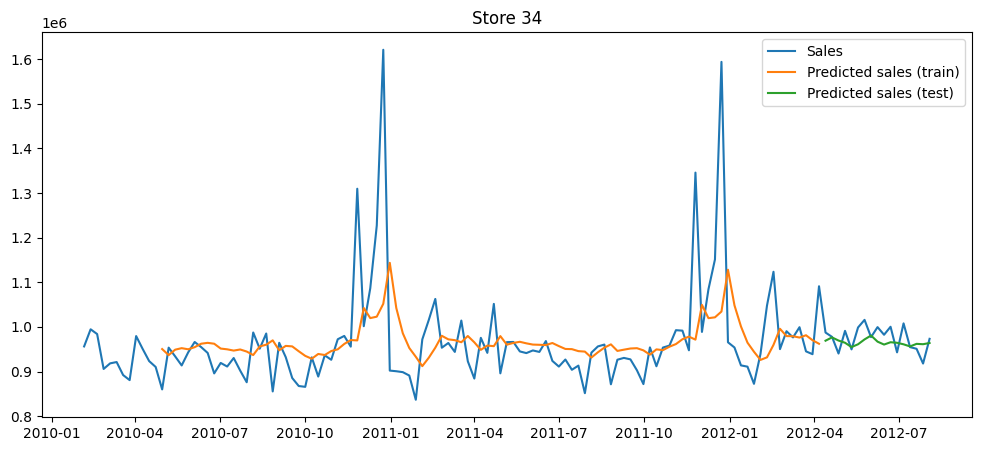

Epoch 1/100
2/2 [==============================] - 2s 10ms/step - loss: 0.1227
Epoch 2/100
2/2 [==============================] - 0s 14ms/step - loss: 0.0948
Epoch 3/100
2/2 [==============================] - 0s 14ms/step - loss: 0.0732
Epoch 4/100
2/2 [==============================] - 0s 13ms/step - loss: 0.0562
Epoch 5/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0441
Epoch 6/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0356
Epoch 7/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0331
Epoch 8/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0337
Epoch 9/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0375
Epoch 10/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0383
Epoch 11/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0370
Epoch 12/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0352
Epoch 13/100
2/2 [==============================] - 0s 9

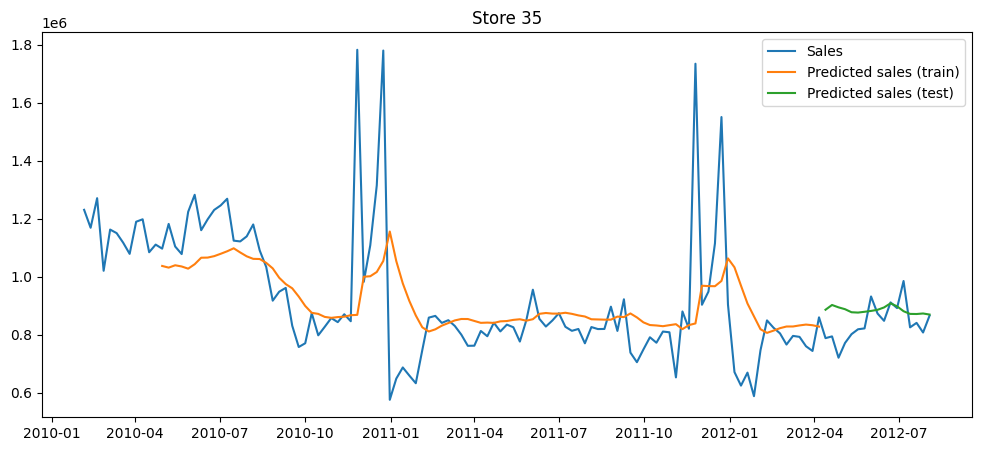

Epoch 1/100
2/2 [==============================] - 2s 9ms/step - loss: 0.3686
Epoch 2/100
2/2 [==============================] - 0s 14ms/step - loss: 0.2804
Epoch 3/100
2/2 [==============================] - 0s 13ms/step - loss: 0.2063
Epoch 4/100
2/2 [==============================] - 0s 12ms/step - loss: 0.1383
Epoch 5/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0850
Epoch 6/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0460
Epoch 7/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0223
Epoch 8/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0140
Epoch 9/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0184
Epoch 10/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0297
Epoch 11/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0335
Epoch 12/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0292
Epoch 13/100
2/2 [==============================] - 0s 9m

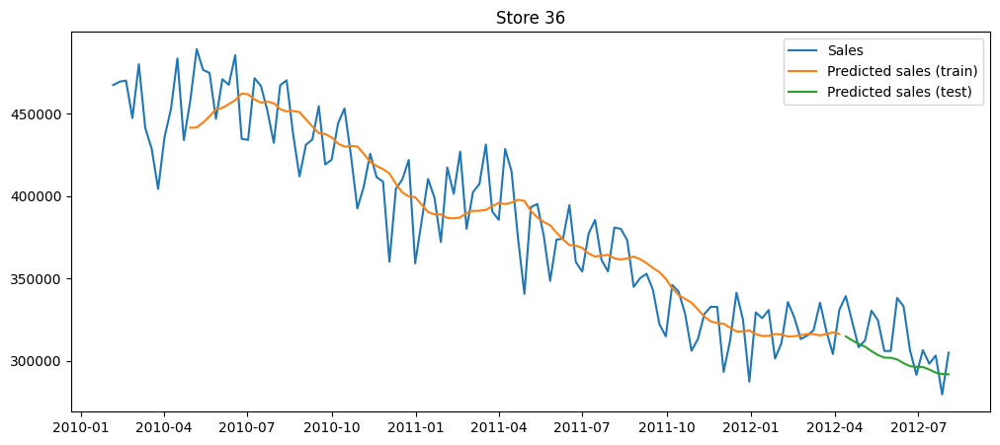

Epoch 1/100
2/2 [==============================] - 1s 9ms/step - loss: 0.0736
Epoch 2/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0489
Epoch 3/100
2/2 [==============================] - 0s 12ms/step - loss: 0.0322
Epoch 4/100
2/2 [==============================] - 0s 13ms/step - loss: 0.0227
Epoch 5/100
2/2 [==============================] - 0s 13ms/step - loss: 0.0225
Epoch 6/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0273
Epoch 7/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0285
Epoch 8/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0258
Epoch 9/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0232
Epoch 10/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0217
Epoch 11/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0216
Epoch 12/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0224
Epoch 13/100
2/2 [==============================] - 

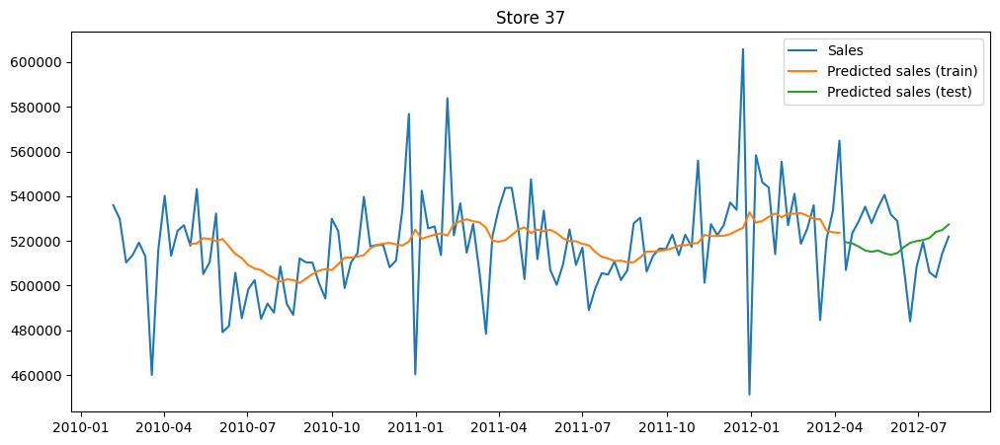

Epoch 1/100
2/2 [==============================] - 1s 8ms/step - loss: 0.2363
Epoch 2/100
2/2 [==============================] - 0s 15ms/step - loss: 0.1915
Epoch 3/100
2/2 [==============================] - 0s 14ms/step - loss: 0.1534
Epoch 4/100
2/2 [==============================] - 0s 11ms/step - loss: 0.1191
Epoch 5/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0920
Epoch 6/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0671
Epoch 7/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0468
Epoch 8/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0318
Epoch 9/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0222
Epoch 10/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0203
Epoch 11/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0242
Epoch 12/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0283
Epoch 13/100
2/2 [==============================] - 0s 

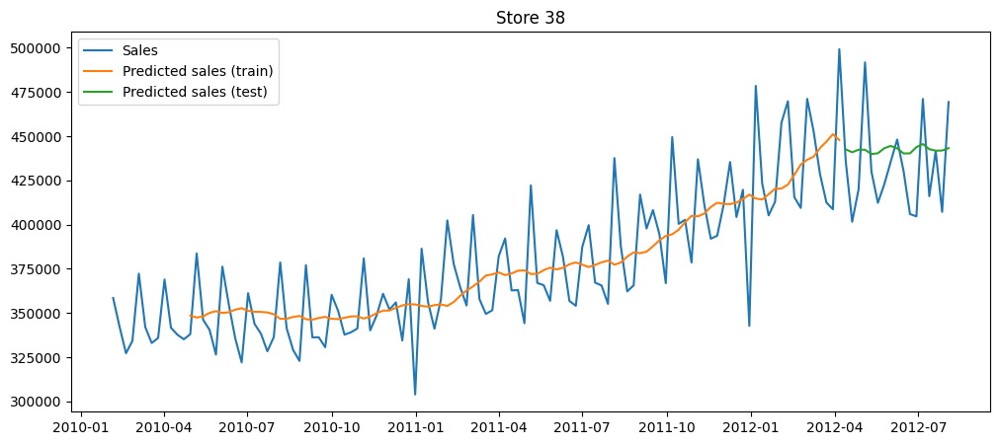

Epoch 1/100
2/2 [==============================] - 2s 14ms/step - loss: 0.0670
Epoch 2/100
2/2 [==============================] - 0s 12ms/step - loss: 0.0542
Epoch 3/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0447
Epoch 4/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0360
Epoch 5/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0309
Epoch 6/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0282
Epoch 7/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0273
Epoch 8/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0291
Epoch 9/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0299
Epoch 10/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0292
Epoch 11/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0280
Epoch 12/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0272
Epoch 13/100
2/2 [==============================] - 0s 9ms/

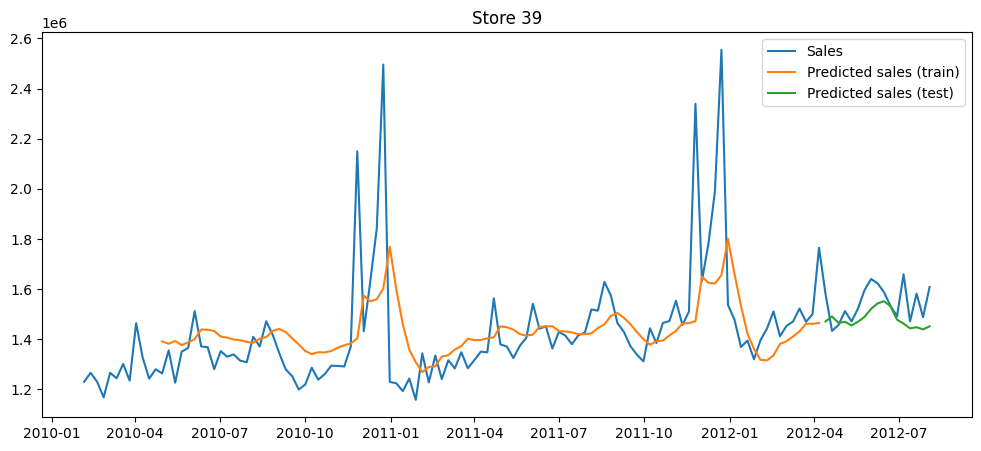

Epoch 1/100
2/2 [==============================] - 2s 8ms/step - loss: 0.0647
Epoch 2/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0492
Epoch 3/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0374
Epoch 4/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0295
Epoch 5/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0241
Epoch 6/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0239
Epoch 7/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0260
Epoch 8/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0269
Epoch 9/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0263
Epoch 10/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0247
Epoch 11/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0238
Epoch 12/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0231
Epoch 13/100
2/2 [==============================] - 0s 10ms

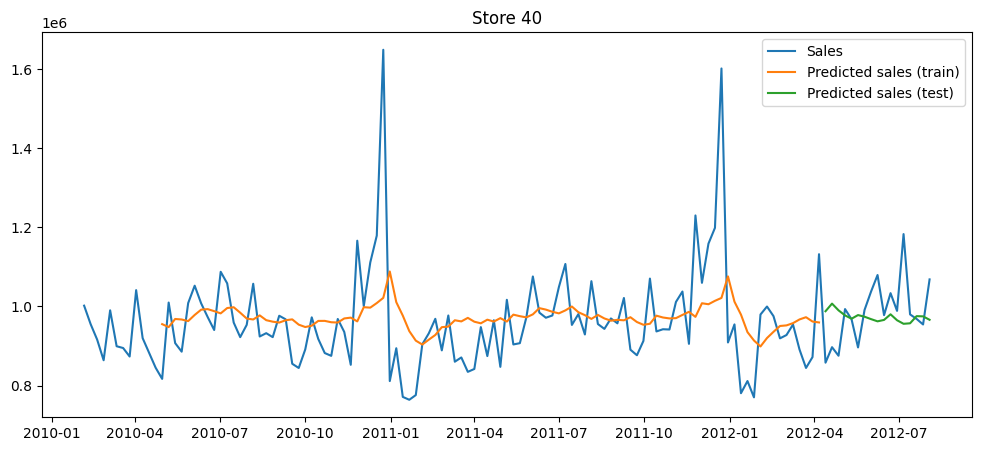

Epoch 1/100
2/2 [==============================] - 2s 9ms/step - loss: 0.0665
Epoch 2/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0515
Epoch 3/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0404
Epoch 4/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0320
Epoch 5/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0262
Epoch 6/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0247
Epoch 7/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0251
Epoch 8/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0263
Epoch 9/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0265
Epoch 10/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0257
Epoch 11/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0245
Epoch 12/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0239
Epoch 13/100
2/2 [==============================] - 0s 9

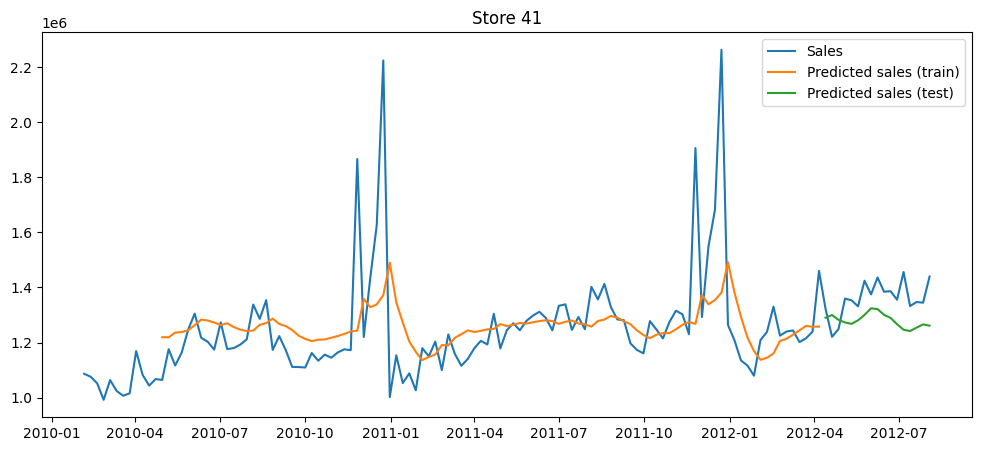

Epoch 1/100
2/2 [==============================] - 3s 13ms/step - loss: 0.2280
Epoch 2/100
2/2 [==============================] - 0s 12ms/step - loss: 0.1817
Epoch 3/100
2/2 [==============================] - 0s 14ms/step - loss: 0.1418
Epoch 4/100
2/2 [==============================] - 0s 13ms/step - loss: 0.1064
Epoch 5/100
2/2 [==============================] - 0s 12ms/step - loss: 0.0782
Epoch 6/100
2/2 [==============================] - 0s 13ms/step - loss: 0.0569
Epoch 7/100
2/2 [==============================] - 0s 12ms/step - loss: 0.0433
Epoch 8/100
2/2 [==============================] - 0s 15ms/step - loss: 0.0418
Epoch 9/100
2/2 [==============================] - 0s 13ms/step - loss: 0.0483
Epoch 10/100
2/2 [==============================] - 0s 13ms/step - loss: 0.0545
Epoch 11/100
2/2 [==============================] - 0s 13ms/step - loss: 0.0533
Epoch 12/100
2/2 [==============================] - 0s 14ms/step - loss: 0.0483
Epoch 13/100
2/2 [==============================]

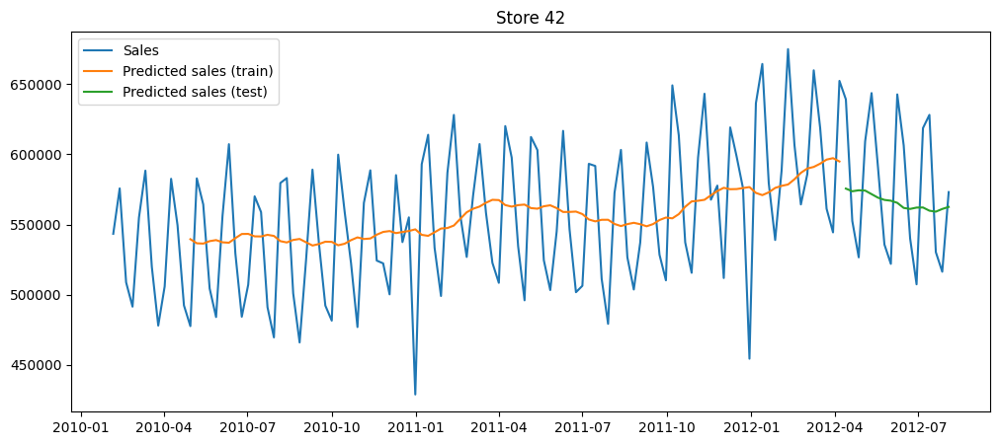

Epoch 1/100
2/2 [==============================] - 2s 11ms/step - loss: 0.3848
Epoch 2/100
2/2 [==============================] - 0s 12ms/step - loss: 0.2997
Epoch 3/100
2/2 [==============================] - 0s 12ms/step - loss: 0.2252
Epoch 4/100
2/2 [==============================] - 0s 11ms/step - loss: 0.1597
Epoch 5/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0999
Epoch 6/100
2/2 [==============================] - 0s 12ms/step - loss: 0.0594
Epoch 7/100
2/2 [==============================] - 0s 12ms/step - loss: 0.0351
Epoch 8/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0385
Epoch 9/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0536
Epoch 10/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0589
Epoch 11/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0509
Epoch 12/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0399
Epoch 13/100
2/2 [==============================] -

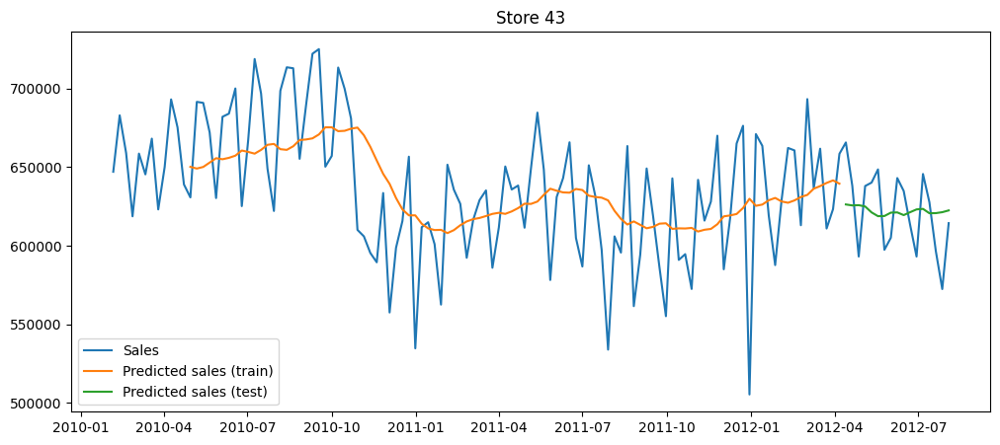

Epoch 1/100
2/2 [==============================] - 2s 10ms/step - loss: 0.1568
Epoch 2/100
2/2 [==============================] - 0s 12ms/step - loss: 0.1160
Epoch 3/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0815
Epoch 4/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0523
Epoch 5/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0317
Epoch 6/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0188
Epoch 7/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0155
Epoch 8/100
2/2 [==============================] - 0s 8ms/step - loss: 0.0201
Epoch 9/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0250
Epoch 10/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0246
Epoch 11/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0209
Epoch 12/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0167
Epoch 13/100
2/2 [==============================] - 0s

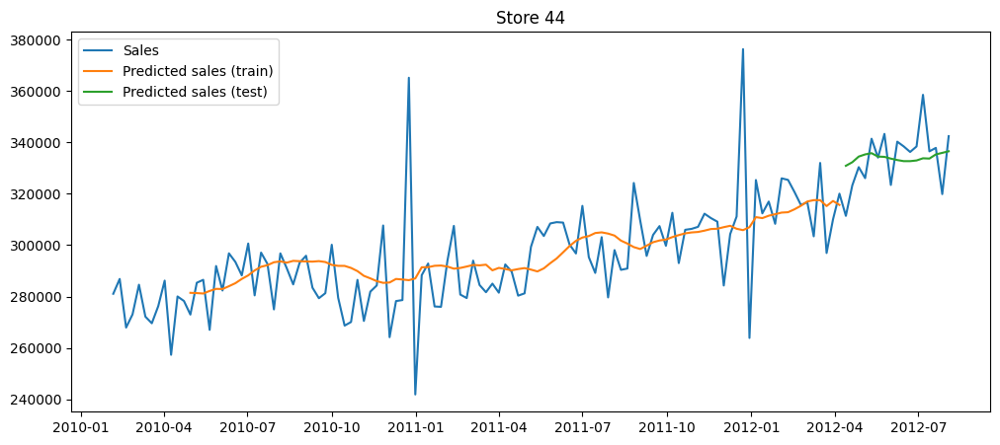

Epoch 1/100
2/2 [==============================] - 2s 9ms/step - loss: 0.0371
Epoch 2/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0292
Epoch 3/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0234
Epoch 4/100
2/2 [==============================] - 0s 11ms/step - loss: 0.0204
Epoch 5/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0206
Epoch 6/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0210
Epoch 7/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0215
Epoch 8/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0212
Epoch 9/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0204
Epoch 10/100
2/2 [==============================] - 0s 9ms/step - loss: 0.0198
Epoch 11/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0194
Epoch 12/100
2/2 [==============================] - 0s 10ms/step - loss: 0.0194
Epoch 13/100
2/2 [==============================] - 0s 

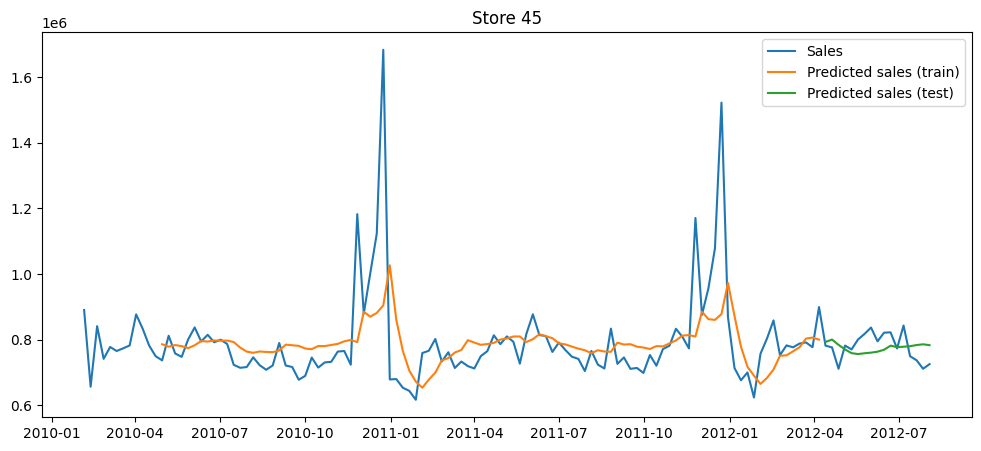

In [105]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

def create_sequences(data, lookback):
    X, y = [], []
    for i in range(len(data) - lookback):
        X.append(data[i:(i + lookback), 0])
        y.append(data[i + lookback, 0])
    return np.array(X), np.array(y)

lookback = 12

for store in dataset['Store'].unique():

    tmp = dataset[dataset['Store'] == store].reset_index(drop=True)
    sales = tmp['Weekly_Sales'].values.reshape(-1, 1)

    scaler = MinMaxScaler(feature_range=(0, 1))
    sales_normalized = scaler.fit_transform(sales)

    train_size = int(len(sales_normalized) * 0.8)
    test_size = len(sales_normalized) - train_size
    train_data, test_data = sales_normalized[0:train_size], sales_normalized[train_size:len(sales_normalized)]

    X_train, y_train = create_sequences(train_data, lookback)
    X_test, y_test = create_sequences(test_data, lookback)

    X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], 1))
    X_test = np.reshape(X_test, (X_test.shape[0], X_test.shape[1], 1))

    model = Sequential()
    model.add(LSTM(50, input_shape=(lookback, 1)))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mean_squared_error')

    model.fit(X_train, y_train, epochs=100, batch_size=64, verbose=1)

    train_predictions = model.predict(X_train)
    test_predictions = model.predict(X_test)

    train_predictions = scaler.inverse_transform(train_predictions)
    y_train = scaler.inverse_transform([y_train])
    test_predictions = scaler.inverse_transform(test_predictions)
    y_test = scaler.inverse_transform([y_test])

    plt.figure(figsize=(12, 5))
    plt.plot(tmp.iloc[:-lookback]['Date'], sales[:-lookback], label='Sales')
    plt.plot(
        tmp.iloc[lookback:lookback+len(train_predictions)]['Date'],
        train_predictions,
        label='Predicted sales (train)'
    )
    plt.plot(
        tmp.iloc[lookback+len(train_predictions):lookback+len(train_predictions)+len(test_predictions)]['Date'],
        test_predictions,
        label='Predicted sales (test)'
    )
    plt.title(f'Store {store}')
    plt.legend()
    plt.show()

O modelo ARIMA, apesar de apresentar baixo valor de erro, foi incapaz de generalizar as previsões para valores futuros, apresentando valor constante quando solicitada uma previsão futura. Por outro lado, o modelo RNN não apresentou bom ajuste aos dados, apresentando valor de erro significante. Deve ser aplicada uma técnica de otimização dos hiperparâmetros para ambos os modelos afim de aprimorar os resultados.

### Modelos de regressão

#### Modelo geral para todas as lojas com One Hot Encoding

In [101]:
from sklearn.ensemble import RandomForestRegressor

from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_percentage_error, r2_score

import matplotlib.pyplot as plt

y = dataset['Weekly_Sales']

X = dataset.copy()
X['year'] = X['Date'].dt.year
X['quarter'] = X['Date'].dt.quarter
X['month'] = X['Date'].dt.month
X['dayOfYear'] = X['Date'].dt.dayofyear
X['day'] = X['Date'].dt.day
X['weekday'] = X['Date'].dt.weekday
X['weekOfMonth'] = X['Date'].apply(lambda x: (x.day-1) // 7 + 1)
X['weekOfYear'] = X['Date'].dt.weekofyear
X = pd.get_dummies(X, columns=['Store'])
X = X.drop(columns=['Date', 'Weekly_Sales'])

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

model = RandomForestRegressor(n_estimators=1000, random_state=42)

model.fit(X_train, y_train)

y_pred = model.predict(X_test)

MAPE = mean_absolute_percentage_error(y_test, y_pred)
R2 = r2_score(y_test, y_pred)

print('MAPE:', MAPE)
print('R2:', R2)

MAPE: 0.04750460136739008
R2: 0.9595211522510646


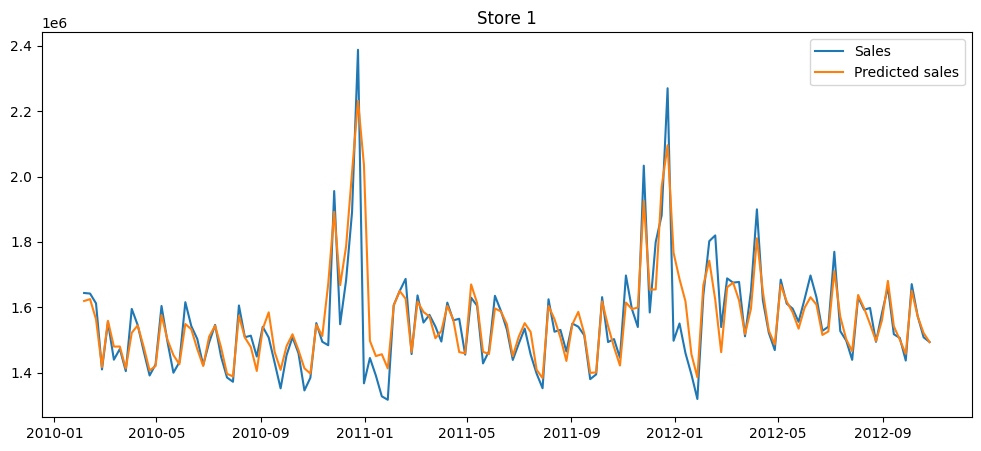

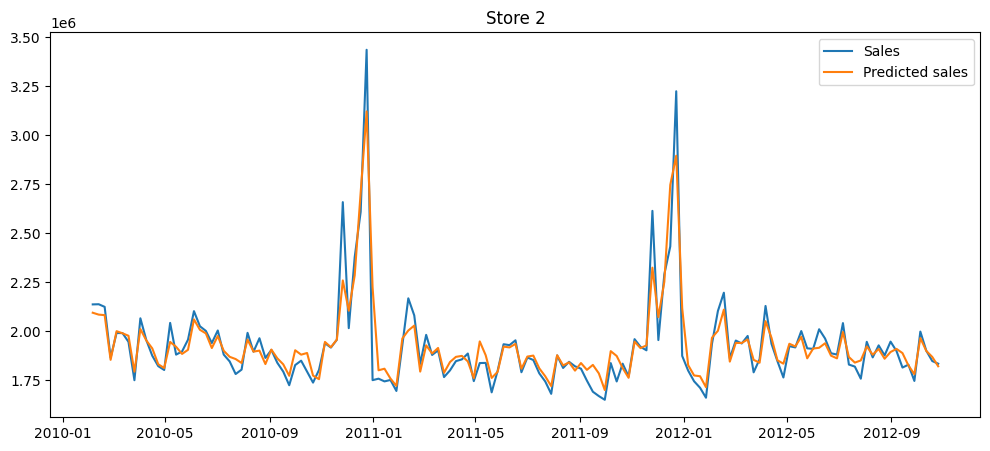

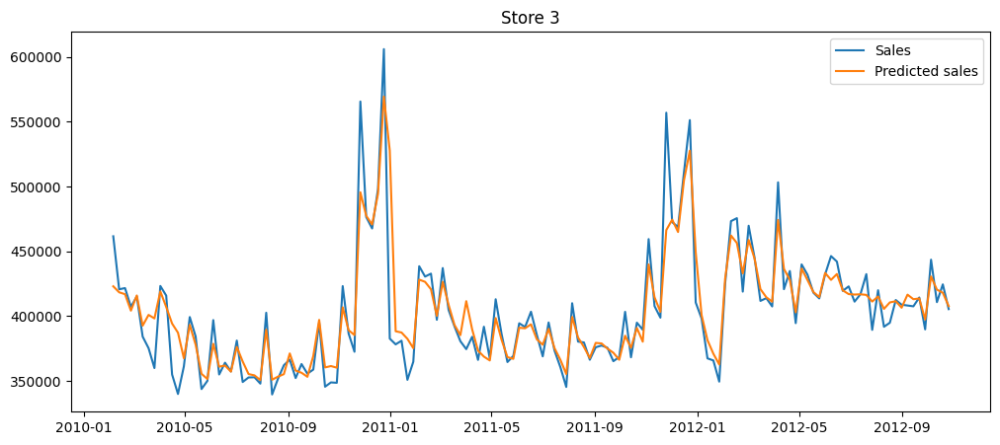

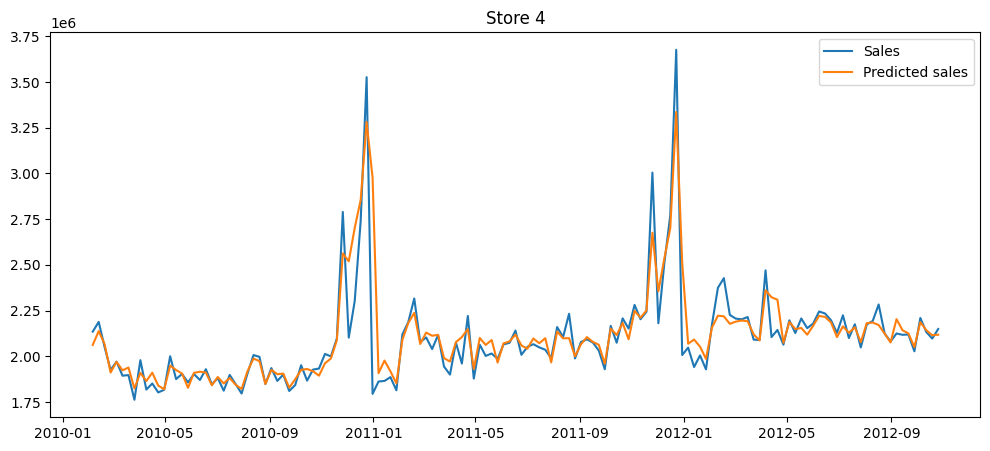

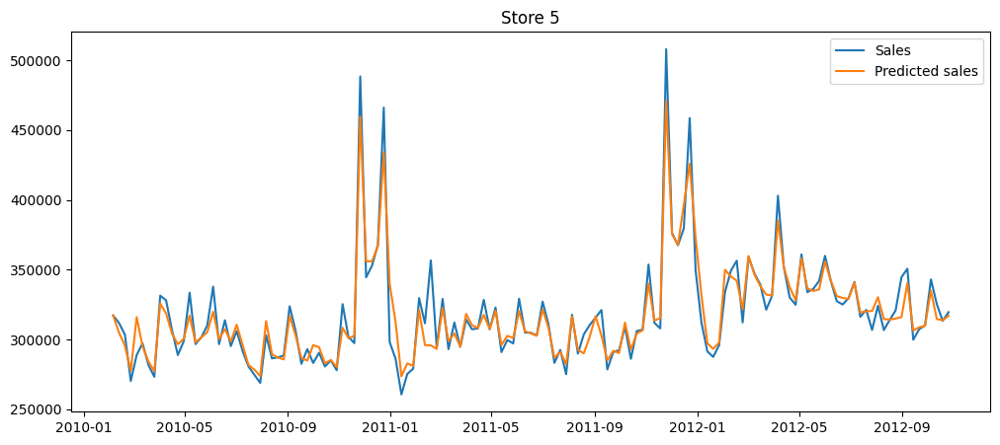

...

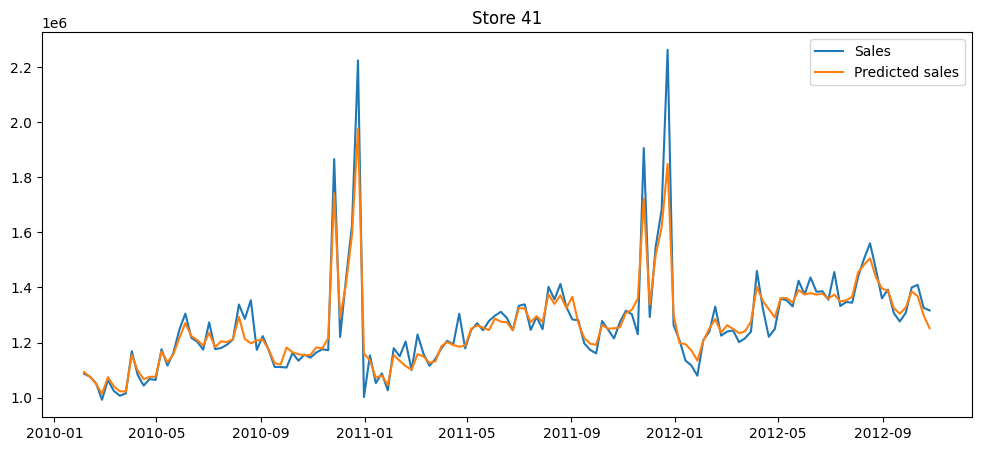

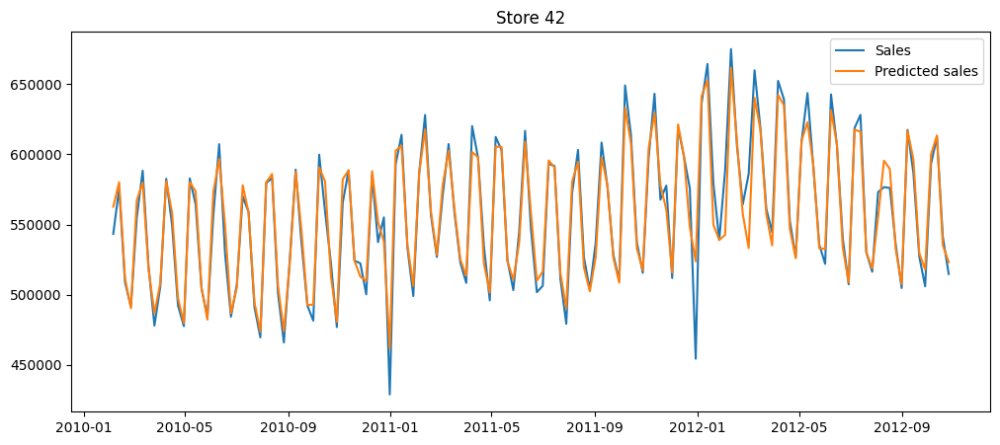

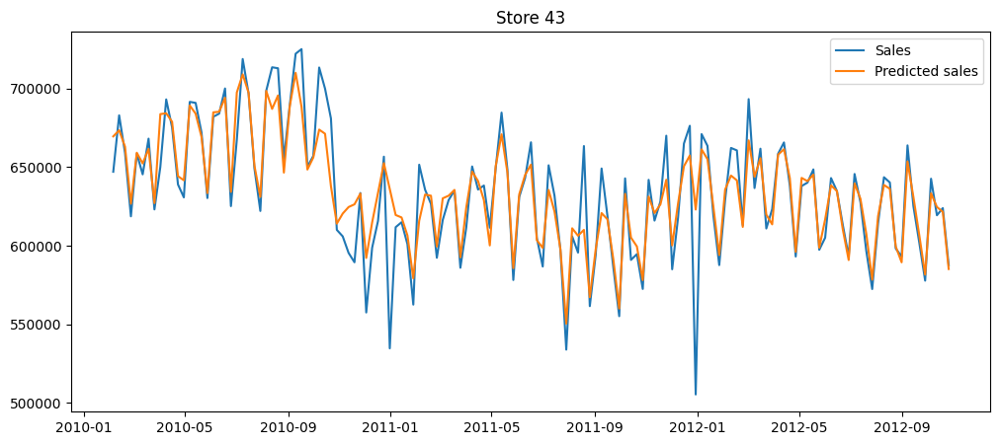

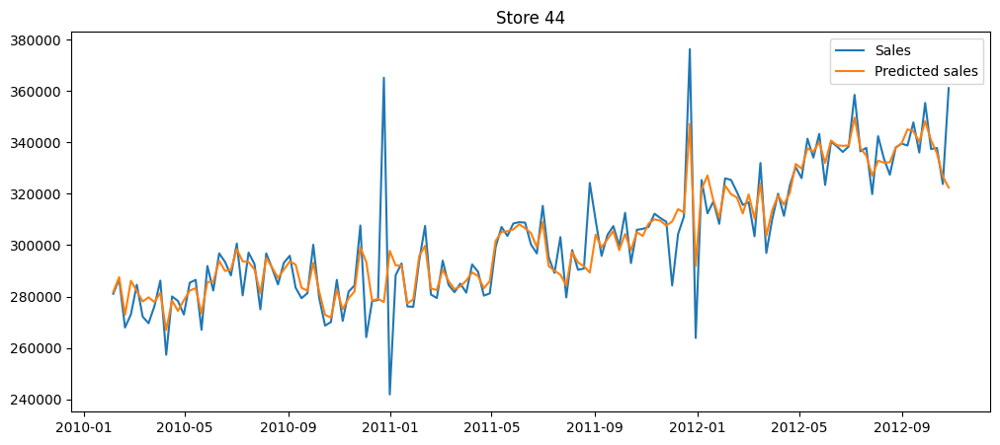

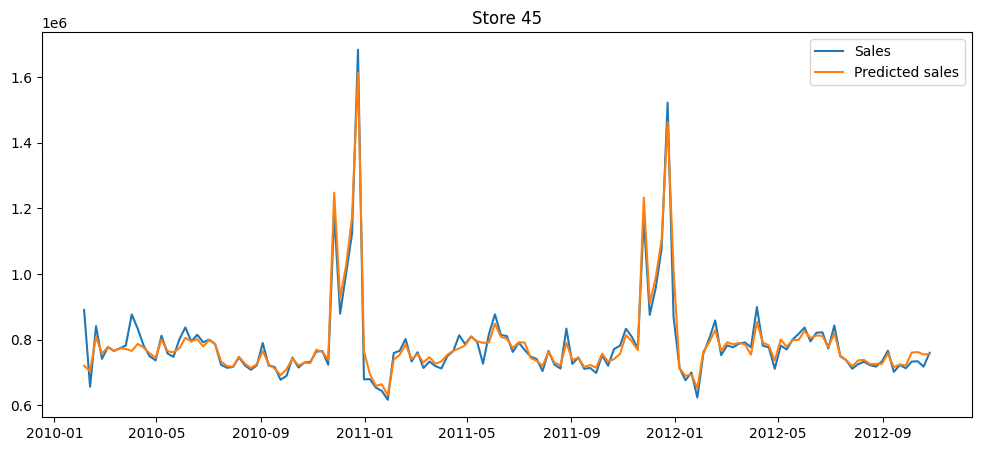

In [102]:
for store in dataset['Store'].unique():
    plt.figure(figsize=(12, 5))
    plt.plot(
        dataset[dataset['Store'] == store]['Date'],
        dataset[dataset['Store'] == store]['Weekly_Sales'],
        label='Sales'
    )
    plt.plot(
        pd.to_datetime(X[X[f'Store_{store}'] == 1][['year', 'month', 'day']]),
        model.predict(X[X[f'Store_{store}'] == 1]),
        label='Predicted sales'
    )

    plt.title(f'Store {store}')
    plt.legend()
    plt.show()